In [ ]:
from config import *

In [ ]:
import spotipy
import json
from spotipy.oauth2 import SpotifyClientCredentials
import lyricsgenius
genius = lyricsgenius.Genius('_rW2f_Td2c9nME5vaG-uGZlZD1gXXteVF9sD9sNstIPNrUpeoWlzASugU0q1XPQM')


#Initialize SpotiPy with user credentias
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id= Client_ID,
                                                           client_secret= Client_Secret))

In [2]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

# Getting all Dylan's songs from all albums

In [ ]:
def get_playlist_tracks(username, playlist_id):
    results = sp.user_playlist_tracks(username,playlist_id)
    tracks = results['items']
    while results['next']:     # if next exists, append next 100
        results = sp.next(results)
        tracks.extend(results['items'])
    return tracks

sp = get_playlist_tracks("spotify", "2SzoMkEmO0yJlVBpOcwfNk")

In [ ]:
def get_playlist_tracks(username, playlist_list):
    tracks = []
    for l in playlist_list:
        results = []
        results.append(l)
        for res in results:
            tracks.append(res['items'])
            while results['next']:
                results = sp.next(results)
                tracks.extend(results['items'])
    return tracks

In [ ]:
dylan = get_playlist_tracks('spotify', "2SzoMkEmO0yJlVBpOcwfNk")

In [ ]:
def list_of_song_names(list_tracks):
    list_ = []
    for index_track in range(len(list_tracks)):
        list_.append([
            list_tracks[index_track]['track']['id'],
            list_tracks[index_track]['track']['artists'][0]['name'],
            list_tracks[index_track]['track']['name'],
            list_tracks[index_track]['track']['album']['name'],
            list_tracks[index_track]['track']['album']['release_date'],
            list_tracks[index_track]['track']['popularity']
        ])
    return list_

In [ ]:
dylan_songs_clean = list_of_song_names(sp)

In [ ]:
dylan_songs_clean

In [ ]:
songs_df = pd.DataFrame(dylan_songs_clean)
songs_df.columns = ['song_id', 'artist', 'song', 'album', 'relase_date', 'popularity']

In [ ]:
songs_df.head()

In [ ]:
len(songs_df)

# Getting feature for all the songs

In [ ]:
def song_features(list_of_songs_clean):
    songs_features = []
    for index_song in range(len(list_of_songs_clean)):
        songs_features.append(sp.audio_features(list_of_songs_clean[index_song][0])[0])
    return songs_features

In [ ]:
dylan_songs_clean[1][0]

In [ ]:
song_features_dict = song_features(dylan_songs_clean)

In [ ]:
song_features_dict

In [ ]:
def features_cleanup(features_songs):
    clean_dict = []
    for dic in features_songs:
        clean_dict.append({feature_key: dic[feature_key] for feature_key in dic.keys() if feature_key not in ['id', 'type', 'uri', 'track_href', 'analysis_url'] })
    return clean_dict

In [ ]:
features_clean = features_cleanup(song_features_dict)
features_clean

In [ ]:
features_df = pd.DataFrame(features_clean)
features_df.head()

In [ ]:
final_df_playlist = pd.concat([songs_df, features_df], axis=1)

In [ ]:
final_df_playlist.head()

# Getting all the lyrics

In [ ]:
artist = genius.search_artist("Bob Dylan", max_songs=570)

In [ ]:
artist.save_lyrics()

In [ ]:
with open('Lyrics_BobDylan.json') as json_file:
    data = json.load(json_file)

In [ ]:
len(data['songs'])

In [ ]:
def dic_lyrics_dylan(json_input):
    dic_songs_lyrics = {}
    for i in range(len(json_input)):
        dic_songs_lyrics[json_input['songs'][i]['title']] = json_input['songs'][i]['lyrics']
    return dic_songs_lyrics

In [ ]:
dic_lyrics_dylan(data)

In [ ]:
final_df_playlist_ = final_df_playlist

In [ ]:
final_df_playlist_['lyrics'] = np.NaN

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in dict_dylan.keys():
        final_df_playlist_['lyrics'][i] = dict_dylan[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = np.NaN

## Missing lyrics

In [ ]:
filtered_df = final_df_playlist_[final_df_playlist_['lyrics'].isnull()]

In [ ]:
filtered_df

In [ ]:
list(filtered_df['album'])

In [ ]:
artist2 = genius.search_artist("Bob Dylan", max_songs=1)

In [ ]:
for ele in list(filtered_df['song']):
    artist2.add_song(ele)

In [ ]:
artist2.save_lyrics()

In [ ]:
with open('LyricsBobDylan_2.json') as json_file:
    data2 = json.load(json_file)

In [ ]:
len(data2)

In [ ]:
dict_dylan2 = dic_lyrics_dylan(data2)

In [ ]:
dict_dylan2

### The Basement Tapes

In [ ]:
def dic_lyrics_dylan_ALBUMS(json_input):
    dic_songs_lyrics = {}
    for i in range(len(json_input)):
        dic_songs_lyrics[json_input['tracks'][i]['song']['title']] = json_input['tracks'][i]['song']['lyrics']
    return dic_songs_lyrics

In [ ]:
album = genius.search_album("The Basement Tapes", "Bob Dylan")

In [ ]:
album.save_lyrics()

In [ ]:
with open('Lyrics_Dylan_TheBasementTapes.json') as json_file:
    data3 = json.load(json_file)

In [ ]:
dict_dylan3 = dic_lyrics_dylan_ALBUMS(data3)

### Triplicate

In [ ]:
album = genius.search_album("Triplicate", "Bob Dylan")

In [ ]:
album.save_lyrics()

In [ ]:
with open('Lyrics_Dylan_Triplicate.json') as json_file:
    data4 = json.load(json_file)

In [ ]:
len(data4)

In [ ]:
dict_dylan4 = dic_lyrics_dylan_ALBUMS(data4)

In [ ]:
def song_year_lyrics(json_file):
    song_year_lyrics_list = []
    for i in range(len(data['songs'])):
        song_year_lyrics_list.append((data['songs'][i]['title'], 
                                      data['songs'][i]['release_date_for_display'], 
                                      data['songs'][i]['lyrics']))

In [ ]:
deandre_data = song_year_lyrics(data)

In [ ]:
song_year_lyrics_list = []
for i in range(len(data['songs'])):
    song_year_lyrics_list.append((data['songs'][i]['title'], data['songs'][i]['release_date_for_display'], data['songs'][i]['lyrics'].replace('\n', ' ').replace("\'", " ")))

### Self Portrait

In [ ]:
album = genius.search_album("Self Portrait", "Bob Dylan")

In [ ]:
album.save_lyrics()

In [ ]:
with open('Lyrics_Dylan_SelfPortrait.json') as json_file:
    data5 = json.load(json_file)

dict_dylan5 = dic_lyrics_dylan_ALBUMS(data5)

In [ ]:
len(dict_dylan5)

In [ ]:
list(final_df_playlist_['album'].unique())

In [ ]:
list_2 =  ['Dylan (1973)',
 'Planet Waves',
 'Blood On The Tracks',
 'The Basement Tapes',
 'Desire',
 'Street-Legal',
 'Slow Train Coming',
 'Saved',
 'Shot Of Love',
 'Infidels',
 'Empire Burlesque',
 'Knocked Out Loaded',
 'Down In The Groove',
 'Oh Mercy',
 'Under The Red Sky',
 'Good As I Been To You',
 'World Gone Wrong',
 'Time Out Of Mind',
 'Love And Theft',
 'Modern Times',
 'Together Through Life',
 'Christmas In The Heart',
 'Tempest',
 'Shadows in the Night',
 'Fallen Angels',
 'Triplicate',
 'Rough and Rowdy Ways']

# DELETE ABOVE - I CAN BATCH DOWNLOAD THE ALBUMS! SO MUCH WASTED TIME FOR NOTHING

In [ ]:
for i in list(final_df_playlist_['album'].unique()):
    album_i = genius.search_album(i, "Bob Dylan")
    album_i.save_lyrics()

In [ ]:
list_2 =  ['Dylan (1973)',
 'Planet Waves',
 'Blood On The Tracks',
 'The Basement Tapes',
 'Desire',
 'Street-Legal',
 'Slow Train Coming',
 'Saved',
 'Shot Of Love',
 'Infidels',
 'Empire Burlesque',
 'Knocked Out Loaded',
 'Down In The Groove',
 'Oh Mercy',
 'Under The Red Sky',
 'Good As I Been To You',
 'World Gone Wrong',
 'Time Out Of Mind',
 'Love And Theft',
 'Modern Times',
 'Together Through Life',
 'Christmas In The Heart',
 'Tempest',
 'Shadows in the Night',
 'Fallen Angels',
 'Triplicate',
 'Rough and Rowdy Ways']

In [ ]:
for i in list_2:
    album_i = genius.search_album(i, "Bob Dylan")
    album_i.save_lyrics()

In [ ]:
list__ = ['Lyrics_TheEssentialBobDylan.json',
 'Lyrics_TheFreewheelinBobDylan.json',
 'Lyrics_TheTimesTheyAreAChangin.json',
 'Lyrics_AnotherSideOfBobDylan.json',
 'Lyrics_BringingItAllBackHome.json',
 'Lyrics_Highway61Revisited.json',
 'Lyrics_BlondeOnBlonde.json',
 'Lyrics_JohnWesleyHarding.json',
 'Lyrics_NashvilleSkyline.json',
 'Lyrics_SelfPortrait.json',
 'Lyrics_NewMorning.json',
 'Lyrics_Dylan1973.json',
 'Lyrics_PlanetWaves.json',
 'Lyrics_BloodOnTheTracks.json',
 'Lyrics_TheBasementTapes.json',
 'Lyrics_Desire.json',
 'Lyrics_StreetLegal.json',
 'Lyrics_SlowTrainComing.json',
 'Lyrics_Saved.json',
 'Lyrics_ShotOfLove.json',
 'Lyrics_Infidels.json',
 'Lyrics_EmpireBurlesque.json',
 'Lyrics_KnockedOutLoaded.json',
 'Lyrics_DownInTheGroove.json',
 'Lyrics_OhMercy.json',
 'Lyrics_UnderTheRedSky.json',
 'Lyrics_GoodAsIBeenToYou.json',
 'Lyrics_WorldGoneWrong.json',
 'Lyrics_TimeOutOfMind.json',
 'Lyrics_LoveAndTheft.json',
 'Lyrics_ModernTimes.json',
 'Lyrics_TogetherThroughLife.json',
 'Lyrics_ChristmasInTheHeart.json',
 'Lyrics_Tempest.json',
 'Lyrics_ShadowsintheNight.json',
 'Lyrics_FallenAngels.json',
 'Lyrics_Triplicate.json',
 'Lyrics_RoughandRowdyWays.json']

In [ ]:
for i in range(len(list__)):
    with open(list__[i]) as json_file:
        data[i] = json.load(json_file)

In [ ]:
len(list__)

In [ ]:
data[0]['tracks'][0]['song']['lyrics']

In [ ]:
len(data[1]['tracks']) 

In [ ]:
def dic_lyrics_dylan_FINAL(json_input):
    dic_songs_lyrics = {}
    number_albums = 38
    for i in range(number_albums):
        for ele in range(len(json_input[i]['tracks'])):
            dic_songs_lyrics[json_input[i]['tracks'][ele]['song']['title']] = json_input[i]['tracks'][ele]['song']['lyrics']
    return dic_songs_lyrics

In [ ]:
dict_final = dic_lyrics_dylan_FINAL(data)

In [ ]:
dict_final.values()

# Thursday - I'm getting the lyrics back again, leaving \n for Spacy

In [ ]:
data_frame = pd.DataFrame(list(dict_final.items()))
data_frame.columns = ['song', 'lyrics']

In [ ]:
data_frame

In [ ]:
final_df_playlist_['song'] = final_df_playlist_['song'].str.lower()

In [ ]:
list(final_df_playlist_['song']) 

In [ ]:
dict_final_lower = {k.lower(): v for k, v in dict_final.items()}

In [ ]:
dict_final_lower = {x.replace("’", ""): v for x, v in dict_final_lower.items()}

In [ ]:
Product_list = dict_final_lower

In [ ]:
Product_list.keys()

In [ ]:
final_df_playlist_['song'] = final_df_playlist_['song'].replace({"\'": ""}, regex=True)

In [ ]:
final_df_playlist_['song']

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in dict_final_lower.keys():
        final_df_playlist_['lyrics'][i] = dict_final_lower[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = np.NaN

In [ ]:
filtered = final_df_playlist_[final_df_playlist_['lyrics'].isnull()]

In [ ]:
list(filtered['song'])

In [ ]:
with open('Lyrics_BobDylan_dunno.json') as json_file:
    final = json.load(json_file)

In [ ]:
final['songs'][0]['title']

In [ ]:
def dic_lyrics_dylan(json_input):
    dic_songs_lyrics = {}
    for i in range(len(json_input['songs'])):
        dic_songs_lyrics[json_input['songs'][i]['title']] = json_input['songs'][i]['lyrics']
    return dic_songs_lyrics

In [ ]:
new = dic_lyrics_dylan(final)

In [ ]:
len(new)

In [ ]:
new_ = {x.replace("’", ""): v for x, v in new.items()}

In [ ]:
new__ = {x.replace("'", ""): v for x, v in new_.items()}

In [ ]:
dict_new_final = {k.lower(): v for k, v in new__.items()}

In [ ]:
dict_new_final.keys()

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in dict_new_final.keys():
        final_df_playlist_['lyrics'][i] = dict_new_final[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = np.NaN

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in dict_new_final.keys():
        final_df_playlist_['lyrics'][i] = dict_new_final[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = np.NaN

In [ ]:
final_df_playlist_

In [ ]:
filtered_ = final_df_playlist_[final_df_playlist_['lyrics'].isnull()]

In [ ]:
final_df_playlist_[final_df_playlist_['song'] == 'love minus zero'] 

In [ ]:
dict_new_final['love minus zero'] = dict_new_final.pop('love minus zero/no limit')

In [ ]:
dict_new_final['leopard-skin pill-box hat'] = dict_new_final.pop('leopard-skin pill box hat')
dict_new_final['fourth time around'] = dict_new_final.pop('fourth time around [live 1966]')

In [ ]:
#drop:

'like a rolling stone - live at the isle of wight, uk - august 1969',
'(quinn the eskimo) the mighty quinn - live at the isle of wight, uk - august 1969',
'minstrel boy - live at the isle of wight, uk - august 1969',
'she belongs to me - live at the isle of wight, uk - august 1969',

In [ ]:
# living the blues, alberta#2, 'odds and ends', 'orange juice blues', 'million dollar bash', 'yazoo street scandal', goin to acapulco,
# 'katies been gone', 'lo and behold!'

In [ ]:
new_key = ['obviously five believers', 'lay, lady, lay', 'copper kettle',
          'forever young - slow version']

In [ ]:
to_be_popped = ['obviously 5 believers', 'lay lady lay', 'copper kettle (the pale moonlight)',
               'forever young (slow version)']

In [ ]:
for i in range(len(new_key)):
    dict_new_final[new_key[i]] = dict_new_final.pop(to_be_popped[i])

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in dict_new_final.keys():
        final_df_playlist_['lyrics'][i] = dict_new_final[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = np.NaN

In [ ]:
final_df_playlist_[final_df_playlist['lyrics'].isnull()]

### Very dirty way of filling up missing lyrics

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in Product_list.keys():
        final_df_playlist_['lyrics'][i] = Product_list[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = final_df_playlist_['lyrics'][i]

In [ ]:
for i in range(len(final_df_playlist_['song'])):
    if final_df_playlist_['song'][i] in dict_new_final.keys():
        final_df_playlist_['lyrics'][i] = dict_new_final[final_df_playlist_['song'][i]]
    else:
        final_df_playlist_['lyrics'][i] = final_df_playlist_['lyrics'][i]

In [ ]:
final_df_playlist_.loc[final_df_playlist_['song'] == 'youre no good', 'lyrics'] = dict_new_final['youre no good']
final_df_playlist_.loc[final_df_playlist_['song'] == 'talkin new york', 'lyrics'] = dict_new_final['talkin new york']

final_df_playlist_.loc[final_df_playlist_['song'] == 'in my time of dyin', 'lyrics'] = dict_new_final['in my time of dyin']
final_df_playlist_.loc[final_df_playlist_['song'] == 'man of constant sorrow', 'lyrics'] = dict_new_final['man of constant sorrow']

final_df_playlist_.loc[final_df_playlist_['song'] == 'fixin to die', 'lyrics'] = dict_new_final['fixin to die']
final_df_playlist_.loc[final_df_playlist_['song'] == 'pretty peggy-o', 'lyrics'] = dict_new_final['pretty peggy-o']

final_df_playlist_.loc[final_df_playlist_['song'] == 'freight train blues', 'lyrics'] = dict_new_final['freight train blues']
final_df_playlist_.loc[final_df_playlist_['song'] == 'highway 51 blues', 'lyrics'] = dict_new_final['highway 51 blues']

final_df_playlist_.loc[final_df_playlist_['song'] == 'gospel plow', 'lyrics'] = dict_new_final['gospel plow']
final_df_playlist_.loc[final_df_playlist_['song'] == 'baby, let me follow you down', 'lyrics'] = dict_new_final['baby, let me follow you down']


final_df_playlist_.loc[final_df_playlist_['song'] == 'house of the risin sun', 'lyrics'] = dict_new_final['house of the risin sun']
final_df_playlist_.loc[final_df_playlist_['song'] == 'song to woody', 'lyrics'] = dict_new_final['song to woody']

final_df_playlist_.loc[final_df_playlist_['song'] == 'see that my grave is kept clean', 'lyrics'] = dict_new_final['see that my grave is kept clean']
final_df_playlist_.loc[final_df_playlist_['song'] == 'love minus zero', 'lyrics'] = dict_new_final['love minus zero']
final_df_playlist_.loc[final_df_playlist_['song'] == 'leopard-skin pill-box hat', 'lyrics'] = dict_new_final['leopard-skin pill-box hat']

final_df_playlist_.loc[final_df_playlist_['song'] == 'fourth time around', 'lyrics'] = dict_new_final['fourth time around']
final_df_playlist_.loc[final_df_playlist_['song'] == 'obviously five believers', 'lyrics'] = dict_new_final['obviously five believers']
final_df_playlist_.loc[final_df_playlist_['song'] == 'lay, lady, lay', 'lyrics'] = dict_new_final['lay, lady, lay']

final_df_playlist_.loc[final_df_playlist_['song'] == 'copper kettle', 'lyrics'] = dict_new_final['copper kettle']

final_df_playlist_.loc[final_df_playlist_['song'] == 'turkey chase', 'lyrics'] = dict_new_final['turkey chase']

final_df_playlist_.loc[final_df_playlist_['song'] == 'final theme', 'lyrics'] = dict_new_final['final theme']

final_df_playlist_.loc[final_df_playlist_['song'] == 'billy 4', 'lyrics'] = dict_new_final['billy 4']

final_df_playlist_.loc[final_df_playlist_['song'] == 'billy 7', 'lyrics'] = dict_new_final['billy 7']

final_df_playlist_.loc[final_df_playlist_['song'] == 'crash on the levee', 'lyrics'] = Product_list['crash on the levee (down in the flood)']


final_df_playlist_.loc[final_df_playlist_['song'] == 'orange juice blues', 'lyrics'] = Product_list['orange juice blues (blues for breakfast)']


final_df_playlist_.loc[final_df_playlist_['song'] == 'orange juice blues', 'lyrics'] = Product_list['orange juice blues (blues for breakfast)']



final_df_playlist_.loc[final_df_playlist_['song'] == 'one more cup of coffee', 'lyrics'] = dict_new_final['one more cup of coffee']

final_df_playlist_.loc[final_df_playlist_['song'] == 'forever young - fast version', 'lyrics'] = dict_new_final['forever young (fast version)']


final_df_playlist_.loc[final_df_playlist_['song'] == 'ragged & dirty', 'lyrics'] = dict_new_final['ragged and dirty']

final_df_playlist_.loc[final_df_playlist_['song'] == 'how deep is the ocean', 'lyrics'] = dict_new_final['how deep is the ocean?']



final_df_playlist_.loc[final_df_playlist_['song'] == 'trying to get to heaven', 'lyrics'] = Product_list['tryin to get to heaven']

final_df_playlist_.loc[final_df_playlist_['song'] == 'where is the one', 'lyrics'] = dict_new_final['where is the one?']
final_df_playlist_.loc[final_df_playlist_['song'] == 'why was i born', 'lyrics'] = dict_new_final['why was i born?']
final_df_playlist_.loc[final_df_playlist_['song'] == 'billy 1', 'lyrics'] = dict_new_final['billy 1']

final_df_playlist_.loc[final_df_playlist_['song'] == 'bunkhouse theme', 'lyrics'] = dict_new_final['bunkhouse theme']
final_df_playlist_.loc[final_df_playlist_['song'] == 'river theme', 'lyrics'] = dict_new_final['river theme']

final_df_playlist_.loc[final_df_playlist_['song'] == 'never gonna the same again', 'lyrics'] = dict_new_final['never gonna be the same again']
final_df_playlist_.loc[final_df_playlist_['song'] == 'froggie went a courtin', 'lyrics'] = dict_new_final['froggie went a-courtin']

final_df_playlist_.loc[final_df_playlist_['song'] == 'main title theme (billy)', 'lyrics'] = dict_new_final['main title theme (billy)']
final_df_playlist_.loc[final_df_playlist_['song'] == 'living the blues', 'lyrics'] = Product_list['living the blues']




# Cleaning up

In [ ]:
final_df_playlist_

In [ ]:
final_df_playlist_.isna().sum()

In [ ]:
filtered_df2 = final_df_playlist_[final_df_playlist_['lyrics'].isnull()]

In [ ]:
filtered_df2

## Cleaning up NaN's - 7 live songs

In [ ]:
final_df = final_df_playlist_.dropna(subset=['lyrics']) #  live songs

In [ ]:
len(final_df)

## Cleaning up date - leave only year

In [ ]:
final_df['relase_date'] = final_df['relase_date'].str[:4]

In [ ]:
## Exporting as csv - file for model - another jupyter notebook

In [ ]:
final_df.to_csv(r'C:/Users/ruben/OneDrive/Área de Trabalho/final_project/model.csv', index = False, header=True)

In [ ]:
df_tutorial_NLP['relase_date'] = df_tutorial_NLP['relase_date'].str[:4]

In [ ]:
df_tutorial_NLP.head()

## Cleaning up lyrics

### Word cleaning

In [ ]:
final_df['lyrics']

In [ ]:
import os
import re
import string

In [ ]:
# Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.

def clean_text_round1(df_col):
    for ele in range(len(df_col)):
        df_col[ele] = df_col[ele].lower()
        df_col[ele] = re.sub('\[.*?\]', '', df_col[ele])
        df_col[ele] = re.sub('[%s]' % re.escape(string.punctuation), '', df_col[ele])
        df_col[ele] = re.sub('\w*\d\w*', '', df_col[ele])

In [ ]:
test_df = final_df.reset_index()

In [ ]:
test_df['lyrics']

#remove identifiers like chorus, verse, etc

all_words = re.sub(r'[\(\[].*?[\)\]]', '', all_words)
#remove empty lines
all_words = os.linesep.join([s for s in all_words.splitlines() if s])

In [ ]:
# Use regex!

final_text_clean = final_df

In [ ]:
dict_to_replace = {'\n':' ', "nothin'" : "nothing", "sailin'":"sailing", "comin'":"coming", "tellin'":"telling", "dreamin'":"dreaming", "sayin'":"saying", "watchin'":"watching",
                "jokin\'":"joking", "jokin'":"joking", "sailin\'":"sailing", "nothin\'" : "nothing", "comin\'":"coming", "tellin\'":"telling",
                "stranglin\'":"strangling", "stranglin'":"strangling", "doin\'":"doing", "doin'":"doing", 
                   "sniffin\'":"sniffing", "sniffin'":"sniffing", "’till":"until", "’\till":"until", 
                   "I\'ll":"I will", "I'll":"I will", "thinkin\'":"thinking", "thinkin'":"thinking", 
                   "braggin\'":"bragging", "braggin'":"bragging", "talkin\'":"talking", "talkin'":"talking", 
                   "doesn\'t":"doesnt", "doesn't":"doesnt", "Ev\'ry":"every", "wasn\'t":"wasnt", "wasn't":"wasnt", 
                   "thrilin\'":"thriling", "thrilin'":"thriling", "chillin\'":"chilling", "chillin'":"chilling", 
                   "ringin\'":"ringing", "ringin'":"ringing", "can\'t":"cant", "can't":"cant", "fishin\'":"fishing", 
                   "fishin'":"fishing", "blowin\'":"blowing", "blowin'":"blowing", "\'till":"until", "'till":"until", 
                   "goin\'":"going", "goin'":"going", "couldn\'t":"couldnt", "couldn't":"couldnt", "would\'t":"wouldnt", "wouldn't":"wouldnt", "shinnin\'":"shinning", "shinnin'":"shinning", "puttin\'":"putting", "puttin'":"putting", "lookin\'":"looking", "lookin'":"looking", "mornin\'":"morning", "mornin'":"morning", "gettin\'":"getting", "gettin'":"getting", "won\'t":"wont", "won't":"wont", "don\'t":"dont", "don’t":"dont", "tryin\'":"trying", "tryin'":"trying", "ain\'t":"aint", "ain't":"aint", "ain’t":"aint","leavin\'":"leaving", "leavin'":"leaving", "doin\'":"doing", "doin'":"doing", "chokin\'":"choking", "chokin'":"choking", "dreamin\'":"dreaming", 
                   "verse":"", "[Intro]":"", "[Outro]":"", "[Verse 1]":"", "[Verse 2]":"", "[Verse 3]":"", "[Verse 4]":"", "[Verse 5]":"", "[Verse 6]":"", "[Verse 7]":"", "[Verse 8]":"", "[Verse 9]":"", "[Chorus]":"",
                   "verse":"", "'ve":" have", "'ll":" will", "don'":"dont", "watchin\'":"watching", "sayin\'":"saying", "watchin\'":"watching"}

In [ ]:
for i in range(len(dict_to_replace.values())):
    final_text_clean['lyrics'] = final_text_clean['lyrics'].apply(lambda x: x.replace(list(dict_to_replace.keys())[i], list(dict_to_replace.values())[i]))

In [ ]:
list(final_text_clean['lyrics'])

In [ ]:
#import re

#s['lyrics'] = s['lyrics'].apply(lambda x: re.sub(r'\[.*\]','',x))

In [ ]:
# verse, chorus

# Tf-Idf analysis - first try

In [ ]:
df_tutorial_NLP.head()

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
# import stop word library from 

import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

In [ ]:
stop_words = stopwords.words('english')

In [ ]:
stop_words.extend(['chorus', '[Verse 1]', '[Verse 2]', '[Verse 3]', '[Verse 4]', '[Verse 5]', '[Verse 6]', '[Verse 7]', '[Verse 8]',
                  'oh','things', 'get', 'yeah', 'verse', 'ill', 'im', 'aint', 'cant', 'theres', 'youre'])

In [ ]:
# create a vectorizer object
# min_df: is there a certain number of songs that a word should appear in order for us to include it. 
    # - involves some experimentation

vectorizer = TfidfVectorizer(stop_words = stop_words, min_df = 0.15)

In [ ]:
# goes through each song and gets the counts of how often each song is appearing. also look at that document frquency - how often that word is appearing in that catalog of music

tfidf = vectorizer.fit_transform(df_tutorial_NLP['lyrics'])

In [ ]:
# Topic: collection of words

# LDA or NMF - they give us a chart. Docs x Topics with a score - how prevalent how these topics are in the songs.
# topics are defined by cetain words

In [ ]:
from sklearn.decomposition import NMF

In [ ]:
nmf = NMF(n_components = 6) # how many topics? it depends.

In [ ]:
topic_values = nmf.fit_transform(tfidf)

In [ ]:
# This is going to show us what are the different words in our individual topics
# the components are what we are pouring out of the nmf
# enumerate: allows us to get the individual value and also the index!
# message - what are the individual words are in our topics

for topic_num, topic in enumerate(nmf.components_):
    message = "Topic #{}: ".format(topic_num + 1) # start at topic with index 1 and not 0
    message += " ".join([vectorizer.get_feature_names()[i] for i in topic.argsort()[:-11 :-1]]) # 
    print (message)
    
# this help us understand what is going on with our topics.
# some words have less meaning than others - we want to remove the songs that don't have a lot of meaning

# Word2Vec test

In [ ]:
!pip install wordcloud

In [ ]:
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from gensim.models import Word2Vec
from matplotlib import rcParams
from matplotlib.patches import Rectangle
from scipy.stats import relfreq
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from wordcloud import WordCloud

warnings.filterwarnings('ignore')

## Word2Vec

In [ ]:
min_count = 2
lyrics = final_text_clean['lyrics'].dropna().values.tolist()
lyrics_tokenized = [lyric.split() for lyric in lyrics]
model = Word2Vec(lyrics_tokenized, size=50, min_count=min_count, window=5)

# create a list of tokens sorted by their frequency
count = CountVectorizer(stop_words='english')
count.fit(np.array(lyrics))
freqs = np.array(count.transform(np.array(lyrics)).todense()).sum(axis=0)
mask = freqs >= min_count
indices = np.argsort(-freqs).squeeze().tolist()
freqs_filtered = freqs[indices]
words_sorted = np.array(count.get_feature_names())[indices]

# project the word embeddings of top n_words_display words down to 2 dimensions
n_words_display = 10
X = model[words_sorted[:n_words_display]]
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

In [ ]:
# print most similar words to query_words
query_words = ['soul', 'love', 'pain', 'future', 'past']
similar_words = [[res[0] for res in model.wv.most_similar(qw)] \
                         for qw in query_words]
for word in query_words:
    print('|{:^15}|'.format(word), end='')
print()
print('=' * 85)
for i in range(10):
    for j in range(5):
        print('|{:^15}|'.format(similar_words[j][i]), end='')
    print()

In [ ]:
# plot 2D projections of top n_words_display words
plt.figure(figsize=(16,16))
ax = plt.gca()
cb = ax.scatter(X_tsne[:,0], X_tsne[:,1], s=20, c=freqs_filtered[:n_words_display],
                cmap='magma', edgecolor='black')
cb = plt.colorbar(cb)
cb.set_label('word frequency', rotation=270, labelpad=30)
ax.axis('off')

# annotate each point
for index, word in enumerate(words_sorted[:n_words_display]):
    xy = X_tsne[index]
    ax.annotate(word, xy=xy, xytext=(5,2), textcoords='offset points',
                 alpha=0.7)

In [ ]:
#remove identifiers like chorus, verse, etc

all_words = re.sub(r'[\(\[].*?[\)\]]', '', all_words)
#remove empty lines
all_words = os.linesep.join([s for s in all_words.splitlines() if s])

# NLP in Python - tutorial

## FROM THE CLEANING SECTION - CONTINUE HERE WITH test_df

In [ ]:
df_tutorial_NLP.to_csv(r'C:/Users/ruben/OneDrive/Área de Trabalho/final_project/dylan_clean.csv', index = False, header=True)

In [7]:
df_tutorial_NLP = pd.read_csv(r'C:/Users/ruben/OneDrive/Área de Trabalho/final_project/dylan_clean.csv')

In [8]:
df_tutorial_NLP.head()

,song_id,artist,song,album,relase_date,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,lyrics
0,6ixNehh9DrMM9vYhN93foh,Bob Dylan,youre no good,Bob Dylan,1962,33,0.563,0.679,0,-6.191,1,0.0441,0.825,0.000000,0.3360,0.760,123.380,97760,4,well i dont know why i love you like i do nob...
1,1X6dRpq3Wi6Jxthi8ZBBBz,Bob Dylan,talkin new york,Bob Dylan,1962,33,0.520,0.443,7,-7.755,1,0.0399,0.811,0.001040,0.0489,0.766,123.900,197653,4,rambling out of the wild west leaving the tow...
2,0udZHhCi7p1YzMlvI4fXoK,Bob Dylan,in my time of dyin,Bob Dylan,1962,34,0.593,0.364,11,-8.346,1,0.0388,0.852,0.000009,0.1480,0.388,125.854,158707,4,well in my time of dying dont want nobody to ...
3,3SF5puV5eb6bgRSxBeMOk9,Bob Dylan,man of constant sorrow,Bob Dylan,1962,36,0.377,0.397,7,-8.427,1,0.0312,0.817,0.049600,0.1870,0.462,108.591,187400,3,i am a man of constant sorrow ive seen troubl...
4,2AyqRzXZ6ZmHcfZ1Mu4Vsj,Bob Dylan,fixin to die,Bob Dylan,1962,30,0.600,0.348,9,-9.660,0,0.0360,0.817,0.000054,0.1100,0.655,127.078,139840,4,feeling funny in my mind lord i believe im fi...


,song_id,artist,song,album,relase_date,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,lyrics


In [9]:
import pickle
import re
import string

In [10]:
df_tutorial_NLP.lyrics =  df_tutorial_NLP.lyrics.replace(r'^\s*$', np.nan, regex=True)

In [11]:
df_tutorial_NLP = df_tutorial_NLP.dropna(subset=['lyrics'])

In [12]:
df_tutorial_NLP = df_tutorial_NLP.reset_index().drop(['index'], axis=1)

In [13]:
df_tutorial_NLP.head()

,song_id,artist,song,album,relase_date,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,lyrics
0,6ixNehh9DrMM9vYhN93foh,Bob Dylan,youre no good,Bob Dylan,1962,33,0.563,0.679,0,-6.191,1,0.0441,0.825,0.000000,0.3360,0.760,123.380,97760,4,well i dont know why i love you like i do nob...
1,1X6dRpq3Wi6Jxthi8ZBBBz,Bob Dylan,talkin new york,Bob Dylan,1962,33,0.520,0.443,7,-7.755,1,0.0399,0.811,0.001040,0.0489,0.766,123.900,197653,4,rambling out of the wild west leaving the tow...
2,0udZHhCi7p1YzMlvI4fXoK,Bob Dylan,in my time of dyin,Bob Dylan,1962,34,0.593,0.364,11,-8.346,1,0.0388,0.852,0.000009,0.1480,0.388,125.854,158707,4,well in my time of dying dont want nobody to ...
3,3SF5puV5eb6bgRSxBeMOk9,Bob Dylan,man of constant sorrow,Bob Dylan,1962,36,0.377,0.397,7,-8.427,1,0.0312,0.817,0.049600,0.1870,0.462,108.591,187400,3,i am a man of constant sorrow ive seen troubl...
4,2AyqRzXZ6ZmHcfZ1Mu4Vsj,Bob Dylan,fixin to die,Bob Dylan,1962,30,0.600,0.348,9,-9.660,0,0.0360,0.817,0.000054,0.1100,0.655,127.078,139840,4,feeling funny in my mind lord i believe im fi...


for i in range(len(dict_to_replace.values())):
    test_df['lyrics'] = test_df['lyrics'].apply(lambda x: x.replace(list(dict_to_replace.keys())[i], list(dict_to_replace.values())[i]))

## Cleaning
### Round 1 -  Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.

In [14]:
# Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.

def clean_text_round1(df_col):
    for ele in range(len(df_col)):
        df_col[ele] = df_col[ele].lower()
        df_col[ele] = re.sub('\[.*?\]', '', df_col[ele])
        df_col[ele] = re.sub('[%s]' % re.escape(string.punctuation), '', df_col[ele])
        df_col[ele] = re.sub('\w*\d\w*', '', df_col[ele])
        
#round1 = lambda x: clean_text_round1(x)

Apply a first round of text cleaning techniques
import re
import string

def clean_text_round1(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = text.str.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

round1 = lambda x: clean_text_round1(text)

In [15]:
clean_text_round1(df_tutorial_NLP.lyrics)

In [16]:
df_tutorial_NLP.lyrics.head()

0     well i dont know why i love you like i do nob...
1     rambling out of the wild west leaving the tow...
2     well in my time of dying dont want nobody to ...
3     i am a man of constant sorrow ive seen troubl...
4     feeling funny in my mind lord i believe im fi...
Name: lyrics, dtype: object

### Round 2

In [17]:
# Apply a second round of cleaning
def clean_text_round2(df_col):
    '''Get rid of some additional punctuation and non-sensical text that was missed the first time around.'''
    for ele in range(len(df_col)):
        df_col[ele] = re.sub('[‘’“”…]', '', df_col[ele])
        df_col[ele] = re.sub('\n', ' ', df_col[ele])


#round2 = lambda x: clean_text_round2(text)

In [18]:
clean_text_round2(df_tutorial_NLP.lyrics)

In [19]:
#for i in range(len(dict_to_replace.values())):
    #test_df['lyrics'] = test_df['lyrics'].apply(lambda x: x.replace(list(dict_to_replace.keys())[i], list(dict_to_replace.values())[i]))

In [20]:
#test_df_new = test_df

In [21]:
# Apply a second round of cleaning
def clean_text_round3(df_col):
    ''' a few things starting with u20...'''
    for ele in range(len(df_col)):
        df_col[ele] = df_col[ele].replace('\u2005', ' ').replace('\u205f', ' ').replace('\u202c', ' ').replace('\u202a', ' ')
        ' '.join(df_col[ele].split())


In [22]:
clean_text_round3(df_tutorial_NLP.lyrics)

In [23]:
list(df_tutorial_NLP.lyrics)

[' well i dont know why i love you like i do nobody in the world can get along with you you got the ways of a devil sleeping in a lions den i come home last night you wouldnt even let me in   oh sometimes youre as sweet as anybody want to be oh when you get the crazy notion of jumping all over me well you give me the blues i guess youre satisfied when you give me the blues i want to lay down and die     i helped you when you had no shoes on your feet pretty mama i helped you when you had no food to eat now youre the kind of woman that just dont understand youre taking all my money and give it to another man   well youre that kind of woman makes a man lose his brains youre that kind of woman drives a man insane well you give me the blues i guess youre satisfied you give me the blues i want to lay down and die',
 ' rambling out of the wild west leaving the towns i love the best thought id seen some ups and downs til i come into new york town people going down to the ground buildings goin

In [24]:
# Let's pickle it for later use

df_tutorial_NLP['lyrics'].to_pickle("corpus.pkl")

## Document-Term Matrix
For many of the techniques we'll be using in future notebooks, the text must be tokenized, meaning broken down into smaller pieces. The most common tokenization technique is to break down text into words. We can do this using scikit-learn's CountVectorizer, where every row will represent a different document and every column will represent a different word.

In addition, with CountVectorizer, we can remove stop words. Stop words are common words that add no additional meaning to text such as 'a', 'the', etc.

In [25]:
list_lyrics = list(df_tutorial_NLP['lyrics'])

In [26]:
# We are going to create a document-term matrix using CountVectorizer, and exclude common English stop words
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
data_cv = cv.fit_transform(list_lyrics)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
#data_dtm.index = list_lyrics.index
data_dtm

abandon  abandoned  abe  abeatin  abel  aberdeen  abide  abiding  ablaze  \
0          0          0    0        0     0         0      0        0       0   
1          0          0    0        0     0         0      0        0       0   
2          0          0    0        0     0         0      0        0       0   
3          0          0    0        0     0         0      0        0       0   
4          0          0    0        0     0         0      0        0       0   
..       ...        ...  ...      ...   ...       ...    ...      ...     ...   
439        0          0    0        0     0         0      0        0       0   
440        0          0    0        0     0         0      0        0       0   
441        0          1    0        0     0         0      0        0       0   
442        0          0    0        0     0         0      0        0       0   
443        0          0    0        0     0         0      0        0       0   

     ablazing  able  ableedin  ableeding  ablowin  ablowing  aboard  abound  \
0           0     0         0          0        0         0       0       0   
1           0     0         0          0        0         0       0       0   
2           0     0         0          0        0         0       0       0   
3           0     0         0          0        0         0       0       2   
4           0     0         0          0        0         0       0       0   
..        ...   ...       ...        ...      ...       ...     ...     ...   
439         0     0         0          0        0         0       0       0   
440         0     0         0          0        0         0       0       0   
441         0     0         0          0        0         0       0       0   
442         0     0         0          0        0         0       0       0   
443         0     0         0          0        0         0       0       0   

     abraham  abreakin  abroad  abstract  abuse  acapulco  acarry  accept  \
0          0         0       0         0      0         0       0       0   
1          0         0       0         0      0         0       0       0   
2          0         0       0         0      0         0       0       0   
3          0         0       0         0      0         0       0       0   
4          0         0       0         0      0         0       0       0   
..       ...       ...     ...       ...    ...       ...     ...     ...   
439        0         0       0         0      0         0       0       0   
440        0         0       0         0      0         0       0       0   
441        0         0       0         0      0         0       0       0   
442        0         0       0         0      0         0       0       0   
443        0         0       0         0      0         0       0       0   

     accepted  accident  accordingly  accordion  account  accountant  accused  \
0           0         0            0          0        0           0        0   
1           0         0            0          0        0           0        0   
2           0         0            0          0        0           0        0   
3           0         0            0          0        0           0        0   
4           0         0            0          0        0           0        0   
..        ...       ...          ...        ...      ...         ...      ...   
439         0         0            0          0        0           0        0   
440         0         0            0          0        0           0        0   
441         0         0            0          0        0           0        0   
442         0         0            0          0        0           0        0   
443         0         0            0          0        0           0        0   

     ace  aces  achangin  ache  ached  aches  achieve  achilles  achin  \
0      0     0         0     0      0      0        0         0      0   
1      0     0         0     0      0

In [41]:
df_tutorial_NLP['song'][256]

'precious memories'

In [27]:
# Let's pickle it for later use
data_dtm.to_pickle("dtm.pkl")

In [28]:
# Let's also pickle the cleaned data (before we put it in document-term matrix format) and the CountVectorizer object
df_tutorial_NLP['lyrics'].to_pickle("data_clean.pkl")
pickle.dump(cv, open("cv.pkl", "wb"))

## Exploratory Data Analysis

Introduction
After the data cleaning step where we put our data into a few standard formats, the next step is to take a look at the data and see if what we're looking at makes sense. Before applying any fancy algorithms, it's always important to explore the data first.

When working with numerical data, some of the exploratory data analysis (EDA) techniques we can use include finding the average of the data set, the distribution of the data, the most common values, etc. The idea is the same when working with text data. We are going to find some more obvious patterns with EDA before identifying the hidden patterns with machines learning (ML) techniques. We are going to look at the following for each comedian:

Most common words - find these and create word clouds
Size of vocabulary - look number of unique words and also how quickly someone speaks

In [29]:
# Read in the document-term matrix
import pandas as pd

data = pd.read_pickle('dtm.pkl')
data = data.transpose()
data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443
abandon,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
abandoned,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
abe,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [30]:
# Find the top 30 words said by each song
top_dict = {}
for c in data.columns:
    top = data[c].sort_values(ascending=False).head(30)
    top_dict[c]= list(zip(top.index, top.values))

top_dict

{0: [('youre', 7),
  ('blues', 4),
  ('kind', 3),
  ('woman', 3),
  ('want', 3),
  ('man', 3),
  ('guess', 2),
  ('oh', 2),
  ('dont', 2),
  ('helped', 2),
  ('die', 2),
  ('satisfied', 2),
  ('lay', 2),
  ('anybody', 1),
  ('makes', 1),
  ('love', 1),
  ('just', 1),
  ('lions', 1),
  ('understand', 1),
  ('mama', 1),
  ('brains', 1),
  ('wouldnt', 1),
  ('money', 1),
  ('lose', 1),
  ('food', 1),
  ('eat', 1),
  ('sleeping', 1),
  ('world', 1),
  ('pretty', 1),
  ('jumping', 1)],
 1: [('york', 6),
  ('new', 6),
  ('got', 5),
  ('said', 4),
  ('town', 4),
  ('people', 3),
  ('sound', 3),
  ('man', 3),
  ('job', 2),
  ('right', 2),
  ('lot', 2),
  ('weeks', 2),
  ('didnt', 2),
  ('play', 2),
  ('loved', 2),
  ('day', 2),
  ('come', 2),
  ('bigger', 2),
  ('bone', 2),
  ('going', 2),
  ('dollar', 2),
  ('long', 2),
  ('blowing', 2),
  ('place', 1),
  ('singers', 1),
  ('just', 1),
  ('paid', 1),
  ('times', 1),
  ('upside', 1),
  ('landed', 1)],
 2: [('jesus', 10),
  ('going', 9),
  ('ma

In [37]:
# Print the top 15 words said by each song

for comedian, top_words in top_dict.items():
    print(comedian)
    print(', '.join([word for word, count in top_words[0:10]]))
    print('---')

0
youre, blues, kind, woman, want, man, guess, oh, dont, helped
---
1
york, new, got, said, town, people, sound, man, job, right
---
2
jesus, going, make, die, easy, dying, want, meet, bed, dont
---
3
im, ill, colorado, ive, abound, days, id, shore, seen, railroad
---
4
fixing, die, im, lord, funny, believe, mind, feeling, dying, head
---
5
pretty, peggyo, captain, gone, come, arunning, dead, mother, lieutenant, say
---
6
highway, know, wont, time, hand, babys, door, die, runs, like
---
7
oh, lord, hold, hand, plow, mary, streets, told, luke, gold
---
8
ill, let, follow, just, world, yes, baby, buy, godalmighty, home
---
9
new, orleans, im, rising, going, sun, foot, life, oh, hes
---
10
got, train, freight, blues, mama, oh, shoes, lord, know, rambling
---
11
im, hey, things, men, song, woody, heres, gone, world, know
---
12
theres, did, ill, ask, hear, favor, white, turned, toll, coffin
---
13
yes, answer, wind, blowin, man, friend, people, times, exist, years
---
14
remember, winds, n

In [32]:
# Look at the most common top words --> add them to the stop word list
from collections import Counter

# Let's first pull out the top 30 words for each comedian
words = []
for song in data.columns:
    top = [word for (word, count) in top_dict[song]]
    for t in top:
        words.append(t)
        
words

['youre',
 'blues',
 'kind',
 'woman',
 'want',
 'man',
 'guess',
 'oh',
 'dont',
 'helped',
 'die',
 'satisfied',
 'lay',
 'anybody',
 'makes',
 'love',
 'just',
 'lions',
 'understand',
 'mama',
 'brains',
 'wouldnt',
 'money',
 'lose',
 'food',
 'eat',
 'sleeping',
 'world',
 'pretty',
 'jumping',
 'york',
 'new',
 'got',
 'said',
 'town',
 'people',
 'sound',
 'man',
 'job',
 'right',
 'lot',
 'weeks',
 'didnt',
 'play',
 'loved',
 'day',
 'come',
 'bigger',
 'bone',
 'going',
 'dollar',
 'long',
 'blowing',
 'place',
 'singers',
 'just',
 'paid',
 'times',
 'upside',
 'landed',
 'jesus',
 'going',
 'make',
 'die',
 'easy',
 'dying',
 'want',
 'meet',
 'bed',
 'dont',
 'lord',
 'time',
 'middle',
 'wings',
 'wont',
 'home',
 'body',
 'air',
 'pair',
 'fail',
 'mourn',
 'foggy',
 'folding',
 'fog',
 'folded',
 'fogs',
 'fold',
 'follow',
 'folk',
 'folks',
 'im',
 'ill',
 'colorado',
 'ive',
 'abound',
 'days',
 'id',
 'shore',
 'seen',
 'railroad',
 'trouble',
 'partly',
 'man',
 '

In [33]:
# Let's aggregate this list and identify the most common words along with how many routines they occur in

Counter(words).most_common()

[('im', 182),
 ('just', 167),
 ('know', 134),
 ('dont', 124),
 ('like', 120),
 ('love', 115),
 ('got', 112),
 ('time', 97),
 ('ill', 92),
 ('come', 86),
 ('theres', 86),
 ('oh', 80),
 ('youre', 77),
 ('night', 77),
 ('say', 74),
 ('tell', 74),
 ('man', 70),
 ('said', 70),
 ('make', 68),
 ('ive', 67),
 ('right', 65),
 ('day', 65),
 ('way', 62),
 ('did', 59),
 ('want', 55),
 ('aint', 54),
 ('mind', 53),
 ('little', 53),
 ('away', 53),
 ('long', 52),
 ('world', 50),
 ('baby', 49),
 ('old', 47),
 ('going', 45),
 ('gonna', 45),
 ('things', 44),
 ('think', 41),
 ('people', 40),
 ('wont', 39),
 ('let', 38),
 ('heart', 38),
 ('hear', 37),
 ('look', 36),
 ('shes', 36),
 ('home', 35),
 ('eyes', 35),
 ('gone', 35),
 ('hand', 33),
 ('thats', 33),
 ('seen', 31),
 ('good', 31),
 ('high', 31),
 ('hes', 30),
 ('hard', 30),
 ('went', 30),
 ('feel', 30),
 ('didnt', 29),
 ('door', 29),
 ('girl', 29),
 ('true', 29),
 ('yes', 28),
 ('far', 28),
 ('foggy', 27),
 ('thing', 26),
 ('place', 25),
 ('road', 25),

In [34]:
# If more than half of the songs have it as a top word, exclude it from the list

add_stop_words = [word for word, count in Counter(words).most_common() if count > 79]
add_stop_words

['im',
 'just',
 'know',
 'dont',
 'like',
 'love',
 'got',
 'time',
 'ill',
 'come',
 'theres',
 'oh']

In [35]:
# Let's update our document-term matrix with the new list of stop words
from sklearn.feature_extraction import text 
from sklearn.feature_extraction.text import CountVectorizer

In [42]:
# Read in cleaned data
data_clean = pd.read_pickle("data_clean.pkl")

In [43]:
# Add new stop words
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

In [44]:
# Recreate document-term matrix

cv = CountVectorizer(stop_words=stop_words)
data_cv = cv.fit_transform(data_clean)
data_stop = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names())
data_stop.index = data_clean.index

In [45]:
# Pickle it for later use

import pickle
pickle.dump(cv, open("cv_stop.pkl", "wb"))
data_stop.to_pickle("dtm_stop.pkl")

In [46]:
# Let's make some word clouds!
# Terminal / Anaconda Prompt: conda install -c conda-forge wordcloud
from wordcloud import WordCloud

wc = WordCloud(stopwords=stop_words, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

In [47]:
len(df_tutorial_NLP)

444

ValueError: num must be 1 <= num <= 12, not 13

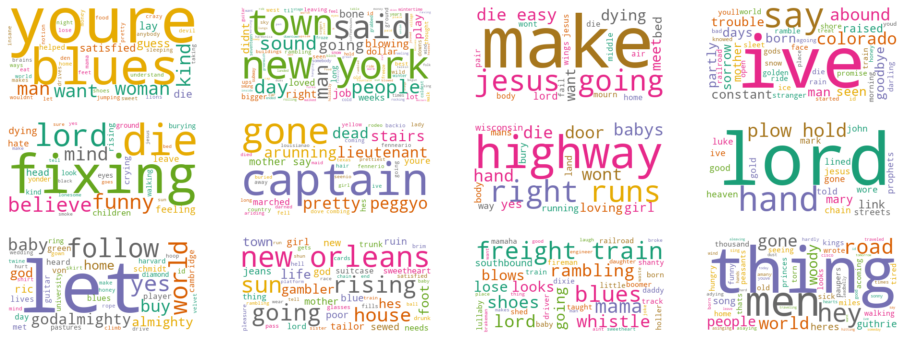

In [48]:
# Reset the output dimensions
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [16, 6]

#full_names = ['Ali Wong', 'Anthony Jeselnik', 'Bill Burr', 'Bo Burnham', 'Dave Chappelle', 'Hasan Minhaj','Jim Jefferies', 'Joe Rogan', 'John Mulaney', 'Louis C.K.', 'Mike Birbiglia', 'Ricky Gervais']

# Create subplots for each comedian
for index, song in enumerate(data.columns):
    wc.generate(data_clean[song])
    
    plt.subplot(3, 4, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    #plt.title(full_names[index])
plt.show()

In [59]:
z = [(2,2), (12,139), (250,250), (59,59), (61,61), (400,400), (75,75), (367,367), (251,251), (425,425), (61,61), (111,111)]

In [61]:
plt.rcParams['figure.figsize'] = [16, 6]

ValueError: num must be 1 <= num <= 12, not 140

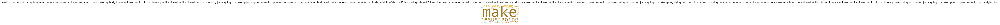

In [64]:
for index, song in z:
    wc.generate(data_clean[song])
    plt.subplot(3, 4, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(data_clean[song])
plt.show()

## Number of Words

### Analysis

In [65]:
names_songs = list(df_tutorial_NLP['song'])

In [66]:
# Find the number of unique words that each song uses


# Identify the non-zero items in the document-term matrix, meaning that the word occurs at least once
unique_list = []
for song in data.columns:
    uniques = data[song].to_numpy().nonzero()[0].size
    unique_list.append(uniques)

# Create a new dataframe that contains this unique word count
data_words = pd.DataFrame(list(zip(names_songs, unique_list)), columns=['song', 'unique_words'])
data_unique_sort = data_words.sort_values(by='unique_words', ascending = False).head(20)
data_unique_sort

,song,unique_words
443,murder most foul,487
380,tempest,375
379,tin angel,330
258,brownsville girl,294
189,hurricane,280
56,"its alright, ma (im only bleeding)",271
161,"lily, rosemary and the jack of hearts",270
66,desolation row,261
53,bob dylans 115th dream,251
324,highlands,238


In [67]:
duration_songs_ms = list(df_tutorial_NLP['duration_ms'])

In [68]:
duration_songs_min = []
for ele in duration_songs_ms:
    duration_songs_min.append((ele/1000)/60)

In [69]:
duration_songs_min

[1.6293333333333335,
 3.2942166666666663,
 2.6451166666666666,
 3.1233333333333335,
 2.3306666666666667,
 3.3613333333333335,
 2.8422166666666664,
 1.74955,
 2.5797833333333333,
 5.300216666666667,
 2.279333333333333,
 2.6666666666666665,
 2.7306666666666666,
 2.7571166666666667,
 3.326216666666667,
 4.522666666666667,
 3.40845,
 2.3377833333333333,
 6.87,
 3.6233333333333335,
 5.001783333333334,
 1.7871166666666667,
 6.421116666666666,
 2.691116666666667,
 1.9693333333333334,
 4.8,
 3.200883333333333,
 5.03845,
 7.07355,
 2.6254,
 4.514733333333334,
 3.4859999999999998,
 4.61845,
 3.244666666666667,
 5.743849999999999,
 5.537966666666667,
 4.099333333333333,
 3.2451166666666666,
 2.4288833333333333,
 7.178883333333333,
 4.80555,
 3.878216666666667,
 4.56445,
 4.38955,
 4.387783333333333,
 8.286,
 3.574,
 2.3548833333333334,
 2.77845,
 3.91045,
 2.851783333333333,
 3.0711166666666667,
 2.5904499999999997,
 6.496666666666667,
 5.508883333333333,
 5.667333333333334,
 7.484883333333333,
 

In [70]:
# Calculate the words per minute of each comedian

# Find the total number of words that a song uses
total_list = []
for song in data.columns:
    totals = sum(data[song])
    total_list.append(totals)
    
# Songs in minutes
song_length = duration_songs_min

# Let's add some columns to our dataframe
data_words['total_words'] = total_list
data_words['run_times'] = song_length
data_words['words_per_minute'] = round((data_words['total_words'] / data_words['run_times']),1)

# Sort the dataframe by words per minute to see where Dylan sings the slowest and fastest

data_wpm_sort = data_words.sort_values(by='words_per_minute')
data_wpm_sort_asc = data_words.sort_values(by='words_per_minute', ascending=False).head(20)

data_wpm_sort

,song,unique_words,total_words,run_times,words_per_minute
138,cant help falling in love,22,28,4.323333,6.5
388,full moon and empty arms,18,25,3.373550,7.4
221,pressing on,36,45,5.237550,8.6
108,let it be me,21,26,3.020667,8.6
389,where are you?,19,31,3.536450,8.8
...,...,...,...,...,...
42,motorpsycho nightmare,188,256,4.564450,56.1
281,wiggle wiggle,49,125,2.162000,57.8
357,here comes santa claus,65,154,2.595550,59.3
366,must be santa,42,190,2.809117,67.6


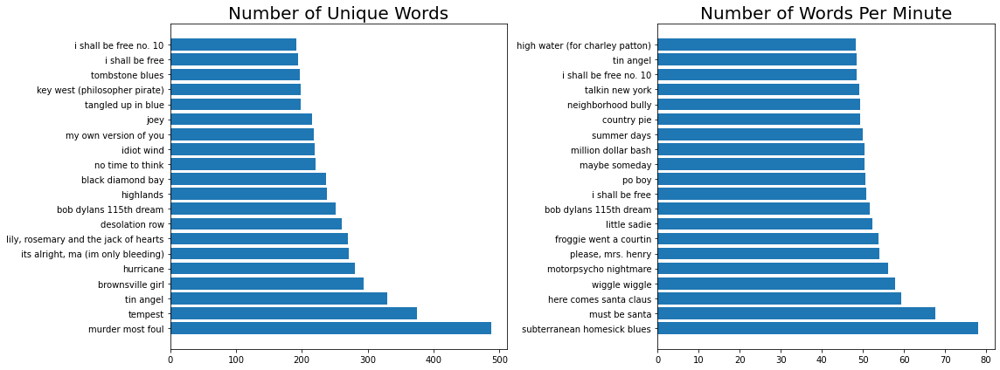

In [71]:
# Let's plot our findings - top 50
import numpy as np

y_pos = np.arange(len(data_wpm_sort_asc))

plt.subplot(1, 2, 1)
plt.barh(y_pos, data_unique_sort.unique_words, align='center')
plt.yticks(y_pos, data_unique_sort.song)
plt.title('Number of Unique Words', fontsize=20)

plt.subplot(1, 2, 2)
plt.barh(y_pos, data_wpm_sort_asc.words_per_minute, align='center')
plt.yticks(y_pos, data_wpm_sort_asc.song)
plt.title('Number of Words Per Minute', fontsize=20)

plt.tight_layout()
plt.show()


In [72]:
# Let's take a look at the most common words again.
Counter(words).most_common()

[('im', 182),
 ('just', 167),
 ('know', 134),
 ('dont', 124),
 ('like', 120),
 ('love', 115),
 ('got', 112),
 ('time', 97),
 ('ill', 92),
 ('come', 86),
 ('theres', 86),
 ('oh', 80),
 ('youre', 77),
 ('night', 77),
 ('say', 74),
 ('tell', 74),
 ('man', 70),
 ('said', 70),
 ('make', 68),
 ('ive', 67),
 ('right', 65),
 ('day', 65),
 ('way', 62),
 ('did', 59),
 ('want', 55),
 ('aint', 54),
 ('mind', 53),
 ('little', 53),
 ('away', 53),
 ('long', 52),
 ('world', 50),
 ('baby', 49),
 ('old', 47),
 ('going', 45),
 ('gonna', 45),
 ('things', 44),
 ('think', 41),
 ('people', 40),
 ('wont', 39),
 ('let', 38),
 ('heart', 38),
 ('hear', 37),
 ('look', 36),
 ('shes', 36),
 ('home', 35),
 ('eyes', 35),
 ('gone', 35),
 ('hand', 33),
 ('thats', 33),
 ('seen', 31),
 ('good', 31),
 ('high', 31),
 ('hes', 30),
 ('hard', 30),
 ('went', 30),
 ('feel', 30),
 ('didnt', 29),
 ('door', 29),
 ('girl', 29),
 ('true', 29),
 ('yes', 28),
 ('far', 28),
 ('foggy', 27),
 ('thing', 26),
 ('place', 25),
 ('road', 25),

data_bad_words = data.transpose()[['fucking', 'fuck', 'shit']]
data_profanity = pd.concat([data_bad_words.fucking + data_bad_words.fuck, data_bad_words.shit], axis=1)
data_profanity.columns = ['f_word', 's_word']
data_profanity

## Sentiment analysis

Introduction¶
So far, all of the analysis we've done has been pretty generic - looking at counts, creating scatter plots, etc. These techniques could be applied to numeric data as well.

When it comes to text data, there are a few popular techniques that we'll be going through in the next few notebooks, starting with sentiment analysis. A few key points to remember with sentiment analysis.

#### TextBlob Module: 
Linguistic researchers have labeled the sentiment of words based on their domain expertise. Sentiment of words can vary based on where it is in a sentence. The TextBlob module allows us to take advantage of these labels.

#### Sentiment Labels: 
Each word in a corpus is labeled in terms of polarity and subjectivity (there are more labels as well, but we're going to ignore them for now). A corpus' sentiment is the average of these.

#### Polarity: 
How positive or negative a word is. -1 is very negative. +1 is very positive.


#### Subjectivity:
How subjective, or opinionated a word is. 0 is fact. +1 is very much an opinion.
For more info on how TextBlob coded up its sentiment function.

Let's take a look at the sentiment of the various transcripts, both overall and throughout the comedy routine

### Sentiment of Routine


In [73]:
# We'll start by reading in the corpus, which preserves word order

data = pd.read_pickle('corpus.pkl')
data

0       well i dont know why i love you like i do nob...
1       rambling out of the wild west leaving the tow...
2       well in my time of dying dont want nobody to ...
3       i am a man of constant sorrow ive seen troubl...
4       feeling funny in my mind lord i believe im fi...
                             ...                        
439     i live on a street named after a saint women ...
440    mother of muses sing for me sing of the mounta...
441     i crossed the rubicon on the  day of the most...
442     mckinley hollered mckinley squalled doctor sa...
443     twas a dark day in dallas november  a day tha...
Name: lyrics, Length: 444, dtype: object

In [74]:
data_df = pd.DataFrame(data)

In [75]:
# Lambda functions to find the polarity and subjectivity of each song

from textblob import TextBlob

pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

data_df['polarity'] = data_df['lyrics'].apply(pol)
data_df['subjectivity'] = data_df['lyrics'].apply(sub)
data_df['song'] = df_tutorial_NLP['song']
data_df

,lyrics,polarity,subjectivity,song
0,well i dont know why i love you like i do nob...,0.152991,0.730342,youre no good
1,rambling out of the wild west leaving the tow...,0.186541,0.450125,talkin new york
2,well in my time of dying dont want nobody to ...,0.262500,0.662500,in my time of dyin
3,i am a man of constant sorrow ive seen troubl...,-0.235000,0.570000,man of constant sorrow
4,feeling funny in my mind lord i believe im fi...,-0.005820,0.681481,fixin to die
...,...,...,...,...
439,i live on a street named after a saint women ...,0.040988,0.522743,goodbye jimmy reed
440,mother of muses sing for me sing of the mounta...,0.211111,0.637607,mother of muses
441,i crossed the rubicon on the day of the most...,0.087753,0.564469,crossing the rubicon
442,mckinley hollered mckinley squalled doctor sa...,0.031034,0.588162,key west (philosopher pirate)


In [102]:
data_df.describe()

,polarity,subjectivity
count,444.000000,444.000000
mean,0.076559,0.508004
std,0.157724,0.121450
min,-0.410000,0.100000
25%,-0.019578,0.438502
50%,0.064652,0.506306
75%,0.169114,0.587191
max,0.700000,0.869444


In [76]:
# Let's plot the results

import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [100, 85]

'''Only plotting the tail for representation purposes'''
data_df_tail = data_df.head(20)


for index, song in enumerate(data_df_tail.index):
    x = data_df_tail.polarity.loc[song]
    y = data_df_tail.subjectivity.loc[song]
    plt.scatter(x, y, color='blue')
    plt.text(x+.01, y+.01, data_df['lyrics'][index], fontsize=10)
    plt.xlim(-.01, .12) 
    
plt.title('Sentiment Analysis', fontsize=1)
plt.xlabel('<-- Negative -------- Positive -->', fontsize=15)
plt.ylabel('<-- Facts -------- Opinions -->', fontsize=15)
plt.show()

In [77]:
plt.savefig('foo.png')

<Figure size 7200x6120 with 0 Axes>

### Sentiment of Routine Over Time
Instead of looking at the overall sentiment, let's see if there's anything interesting about the sentiment over time throughout each routine.

In [78]:
# Split each routine into 10 parts
import numpy as np
import math

def split_text(text, n=10):
    '''Takes in a string of text and splits into n equal parts, with a default of 10 equal parts.'''

    # Calculate length of text, the size of each chunk of text and the starting points of each chunk of text
    length = len(text)
    size = math.floor(length / n)
    start = np.arange(0, length, size)
    
    # Pull out equally sized pieces of text and put it into a list
    split_list = []
    for piece in range(n):
        split_list.append(text[start[piece]:start[piece]+size])
    return split_list

In [79]:
# Let's take a look at our data again
data_df

,lyrics,polarity,subjectivity,song
0,well i dont know why i love you like i do nob...,0.152991,0.730342,youre no good
1,rambling out of the wild west leaving the tow...,0.186541,0.450125,talkin new york
2,well in my time of dying dont want nobody to ...,0.262500,0.662500,in my time of dyin
3,i am a man of constant sorrow ive seen troubl...,-0.235000,0.570000,man of constant sorrow
4,feeling funny in my mind lord i believe im fi...,-0.005820,0.681481,fixin to die
...,...,...,...,...
439,i live on a street named after a saint women ...,0.040988,0.522743,goodbye jimmy reed
440,mother of muses sing for me sing of the mounta...,0.211111,0.637607,mother of muses
441,i crossed the rubicon on the day of the most...,0.087753,0.564469,crossing the rubicon
442,mckinley hollered mckinley squalled doctor sa...,0.031034,0.588162,key west (philosopher pirate)


In [80]:
# Let's create a list to hold all of the pieces of text
list_pieces = []
for t in data_df['lyrics']:
    try:
        split = split_text(t)
        list_pieces.append(split)
    except:
        print(t+'has nothing')
    
list_pieces

[[' well i dont know why i love you like i do nobody in the world can get along with',
  ' you you got the ways of a devil sleeping in a lions den i come home last night y',
  'ou wouldnt even let me in   oh sometimes youre as sweet as anybody want to be oh ',
  'when you get the crazy notion of jumping all over me well you give me the blues i',
  ' guess youre satisfied when you give me the blues i want to lay down and die     ',
  'i helped you when you had no shoes on your feet pretty mama i helped you when you',
  ' had no food to eat now youre the kind of woman that just dont understand youre t',
  'aking all my money and give it to another man   well youre that kind of woman mak',
  'es a man lose his brains youre that kind of woman drives a man insane well you gi',
  've me the blues i guess youre satisfied you give me the blues i want to lay down '],
 [' rambling out of the wild west leaving the towns i love the best thought id seen some ups and downs til i come into new york t

In [81]:
# The list has 10 elements, one for each transcript
len(list_pieces)

444

In [82]:
# Each transcript has been split into 10 pieces of text
len(list_pieces[0])

10

In [83]:
# Calculate the polarity for each piece of text

polarity_transcript = []
for lp in list_pieces:
    polarity_piece = []
    for p in lp:
        polarity_piece.append(TextBlob(p).sentiment.polarity)
    polarity_transcript.append(polarity_piece)
    
polarity_transcript

[[0.5,
  0.0,
  0.35,
  -0.6,
  0.17222222222222222,
  0.25,
  0.6,
  0.6,
  -0.2,
  0.17222222222222222],
 [0.31616161616161614,
  0.21103896103896103,
  -0.01948051948051948,
  -0.15555555555555559,
  0.09166666666666667,
  0.3148148148148148,
  0.21948051948051953,
  0.475,
  0.2,
  0.11119528619528618],
 [0.0,
  0.43333333333333335,
  0.43333333333333335,
  0.0,
  -0.5,
  0.43333333333333335,
  0.0,
  0.0,
  0.43333333333333335,
  0.0],
 [-0.1, -0.5, -0.05, -0.25, -0.1, 0.0, 0.0, -0.25, 0.0, -0.6999999999999998],
 [0.25,
  -0.8,
  -0.2,
  0.19814814814814816,
  0.25,
  -0.3888888888888889,
  0.0,
  0.425,
  0.425,
  -0.5],
 [0.022222222222222213,
  0.06296296296296294,
  0.25,
  0.25,
  -0.15555555555555559,
  -0.015277777777777793,
  0.0,
  0.1,
  -0.1851851851851852,
  -0.05000000000000001],
 [0.2857142857142857,
  0.2857142857142857,
  0.2222222222222222,
  -0.25,
  0.0,
  0.0,
  -0.15555555555555559,
  0.0,
  0.0,
  0.0],
 [0.0, 0.0, 0.0, 0.7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [0

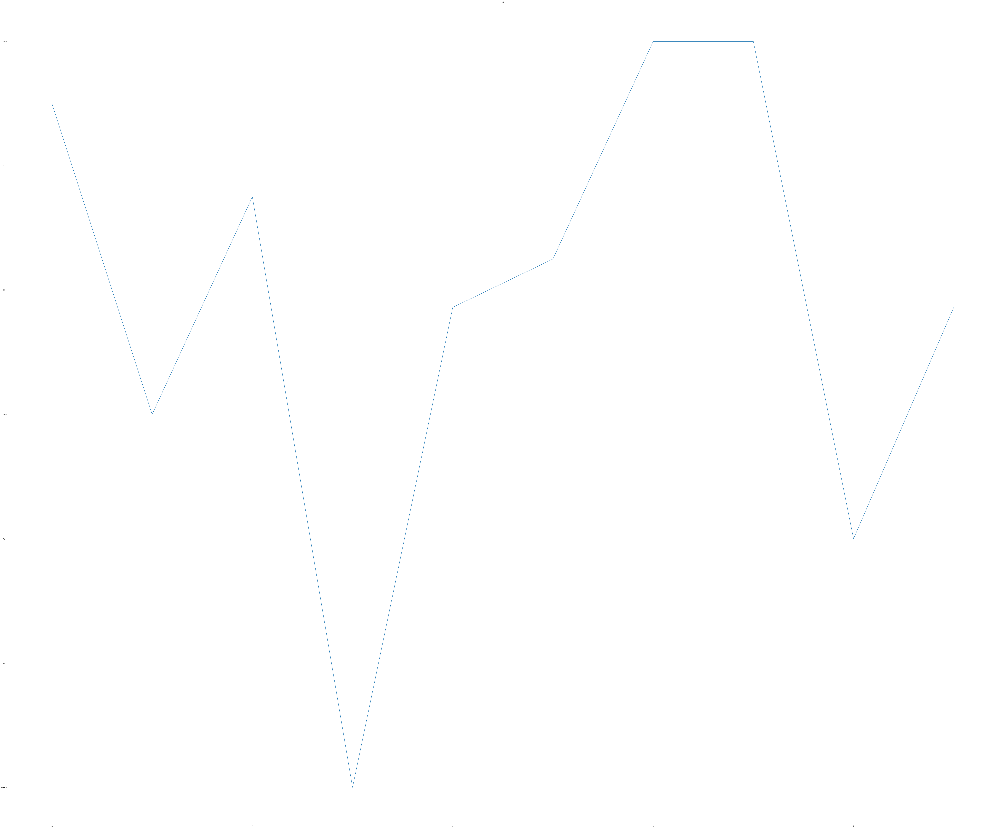

In [84]:
# Show the plot for one song

plt.plot(polarity_transcript[0])
plt.title(data_df['lyrics'].index[0])
plt.show()

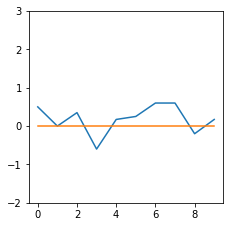

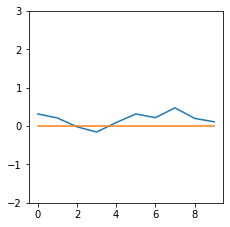

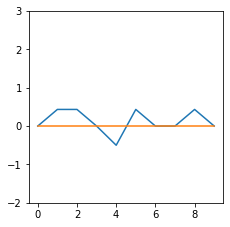

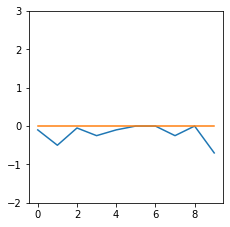

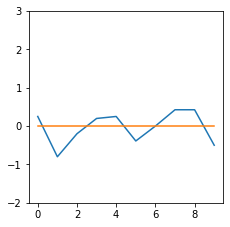

...

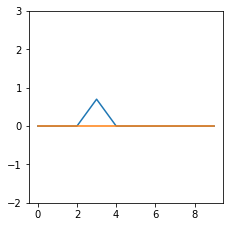

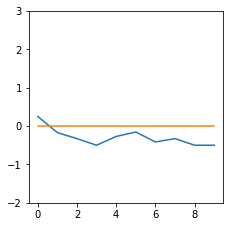

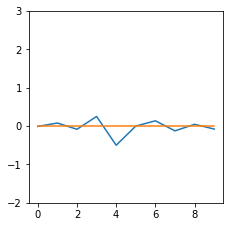

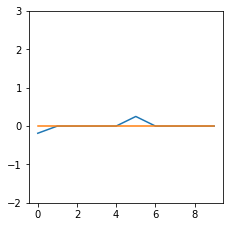

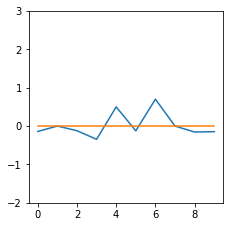

ValueError: num must be 1 <= num <= 12, not 13

<Figure size 1152x864 with 0 Axes>

In [85]:
# Show the plot for all songs
plt.rcParams['figure.figsize'] = [16, 12]

for index, comedian in enumerate(data.index):    
    plt.subplot(3, 4, index+1)
    plt.plot(polarity_transcript[index])
    plt.plot(np.arange(0,10), np.zeros(10))
    #plt.title(data_df['lyrics'][index])
    plt.ylim(ymin=-2, ymax=3)
    plt.show()

In [ ]:
# Setiment throughout the years

In [86]:
df_tutorial_NLP.head()

,song_id,artist,song,album,relase_date,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,lyrics
0,6ixNehh9DrMM9vYhN93foh,Bob Dylan,youre no good,Bob Dylan,1962,33,0.563,0.679,0,-6.191,1,0.0441,0.825,0.000000,0.3360,0.760,123.380,97760,4,well i dont know why i love you like i do nob...
1,1X6dRpq3Wi6Jxthi8ZBBBz,Bob Dylan,talkin new york,Bob Dylan,1962,33,0.520,0.443,7,-7.755,1,0.0399,0.811,0.001040,0.0489,0.766,123.900,197653,4,rambling out of the wild west leaving the tow...
2,0udZHhCi7p1YzMlvI4fXoK,Bob Dylan,in my time of dyin,Bob Dylan,1962,34,0.593,0.364,11,-8.346,1,0.0388,0.852,0.000009,0.1480,0.388,125.854,158707,4,well in my time of dying dont want nobody to ...
3,3SF5puV5eb6bgRSxBeMOk9,Bob Dylan,man of constant sorrow,Bob Dylan,1962,36,0.377,0.397,7,-8.427,1,0.0312,0.817,0.049600,0.1870,0.462,108.591,187400,3,i am a man of constant sorrow ive seen troubl...
4,2AyqRzXZ6ZmHcfZ1Mu4Vsj,Bob Dylan,fixin to die,Bob Dylan,1962,30,0.600,0.348,9,-9.660,0,0.0360,0.817,0.000054,0.1100,0.655,127.078,139840,4,feeling funny in my mind lord i believe im fi...


### group by release_year

In [87]:
information = [df_tutorial_NLP["relase_date"], data_df[["polarity", 'subjectivity']]]

#headers = ["release_year", "polarity", "subjectivity"]

df3 = pd.concat(information, axis=1)

In [88]:
df3.head()

,relase_date,polarity,subjectivity
0,1962,0.152991,0.730342
1,1962,0.186541,0.450125
2,1962,0.262500,0.662500
3,1962,-0.235000,0.570000
4,1962,-0.005820,0.681481


In [171]:
year_sentiment = df3.groupby('relase_date').agg({"polarity":'mean',"subjectivity":'mean'}).reset_index()

In [172]:
year_sentiment.head()

,relase_date,polarity,subjectivity
0,1962,0.062994,0.564212
1,1963,0.092260,0.483222
2,1964,0.026346,0.464760
3,1965,0.041561,0.469548
4,1966,0.013626,0.448012


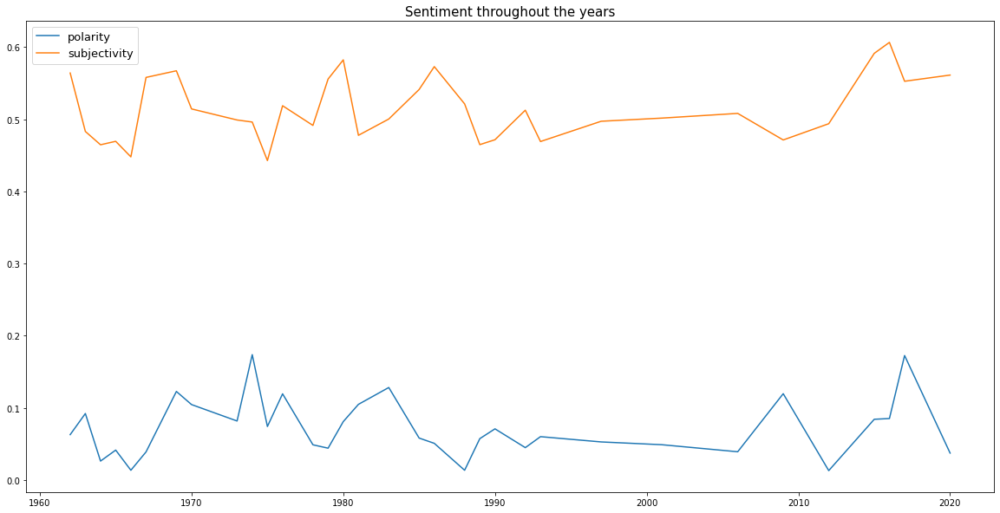

In [173]:
plt.figure(figsize=(20, 10))
plt.plot(year_sentiment['relase_date'], year_sentiment['polarity'], label = 'polarity')
plt.plot(year_sentiment['relase_date'], year_sentiment['subjectivity'], label = 'subjectivity')
plt.title('Sentiment throughout the years', size=15)
plt.legend(loc=2, prop={'size': 13})

In [186]:
def draw_heatmap(data,inner_row, inner_col, outer_row, outer_col, values, vmin,vmax):
    sns.set(font_scale=1)
    fg = sns.FacetGrid(
        data, 
        row=outer_row,
        col=outer_col, 
        margin_titles=True
    )

    position = left, bottom, width, height = 1.4, .2, .1, .6
    cbar_ax = fg.fig.add_axes(position) 

    fg.map_dataframe(
        draw_heatmap_facet, 
        x_col=inner_col,
        y_col=inner_row, 
        values=values, 
        cbar_ax=cbar_ax,
        vmin=vmin, 
        vmax=vmax
    )

    fg.fig.subplots_adjust(right=1.3)  
    plt.show()

def draw_heatmap_facet(*args, **kwargs):
    data = kwargs.pop('data')
    x_col = kwargs.pop('x_col')
    y_col = kwargs.pop('y_col')
    values = kwargs.pop('values')
    d = data.pivot(index=y_col, columns=x_col, values=values)
    annot = round(d,4).values
    cmap = sns.color_palette("Blues",30) + sns.color_palette("Blues",30)[0::2]
    #cmap = sns.color_palette("Blues",30)
    sns.heatmap(
        d, 
        **kwargs,
        annot=annot, 
        center=0, 
        cmap=cmap, 
        linewidth=.5
    )

# Data preparation
_ = data.copy()
_['Year'] = pd.cut(_['Year'],bins=[2006,2008,2012,2018])

_['GDP per Capita'] = _.groupby(['Continent','Year'])['Log GDP per capita'].transform(
    pd.qcut,
    q=3,
    labels=(['Low','Medium','High'])
).fillna('Low')

_['Corruption'] = _.groupby(['Continent','GDP per Capita'])['Perceptions of corruption'].transform(
    pd.qcut,
    q=3,
    labels=(['Low','Medium','High'])
)

_ = _[_['Continent'] != 'Oceania'].groupby(['Year','Continent','GDP per Capita','Corruption'])['Life Ladder'].mean().reset_index()
_['Life Ladder'] = _['Life Ladder'].fillna(-10)

draw_heatmap(
    data=_,
    outer_row='Corruption',
    outer_col='GDP per Capita',
    inner_row='Year',
    inner_col='Continent',
    values='Life Ladder',
    vmin=3,
    vmax=8,
)

KeyError: 'Year'

### group by album

In [134]:
information = [df_tutorial_NLP["relase_date"], df_tutorial_NLP["album"], data_df[["polarity", 'subjectivity']]]

#headers = ["release_year", "polarity", "subjectivity"]

df_album = pd.concat(information, axis=1)

In [135]:
df_album.head()

,relase_date,album,polarity,subjectivity
0,1962,Bob Dylan,0.152991,0.730342
1,1962,Bob Dylan,0.186541,0.450125
2,1962,Bob Dylan,0.262500,0.662500
3,1962,Bob Dylan,-0.235000,0.570000
4,1962,Bob Dylan,-0.005820,0.681481


In [157]:
album_sentiment = df_album.groupby(['album', 'relase_date']).agg({"polarity":'mean',"subjectivity":'mean'}).reset_index()

In [158]:
album_sentiment.head()

,album,relase_date,polarity,subjectivity
0,Another Side Of Bob Dylan,1964,0.046956,0.486301
1,Blonde On Blonde,1966,0.013626,0.448012
2,Blood On The Tracks,1975,0.016913,0.482040
3,Bob Dylan,1962,0.062994,0.564212
4,Bringing It All Back Home,1965,0.014654,0.472849


In [159]:
album_sentiment = album_sentiment.sort_values(by=['relase_date'], ascending=True)

In [160]:
album_sentiment.head()

,album,relase_date,polarity,subjectivity
3,Bob Dylan,1962,0.062994,0.564212
32,The Freewheelin' Bob Dylan,1963,0.092260,0.483222
0,Another Side Of Bob Dylan,1964,0.046956,0.486301
33,The Times They Are A-Changin',1964,0.003674,0.441064
4,Bringing It All Back Home,1965,0.014654,0.472849


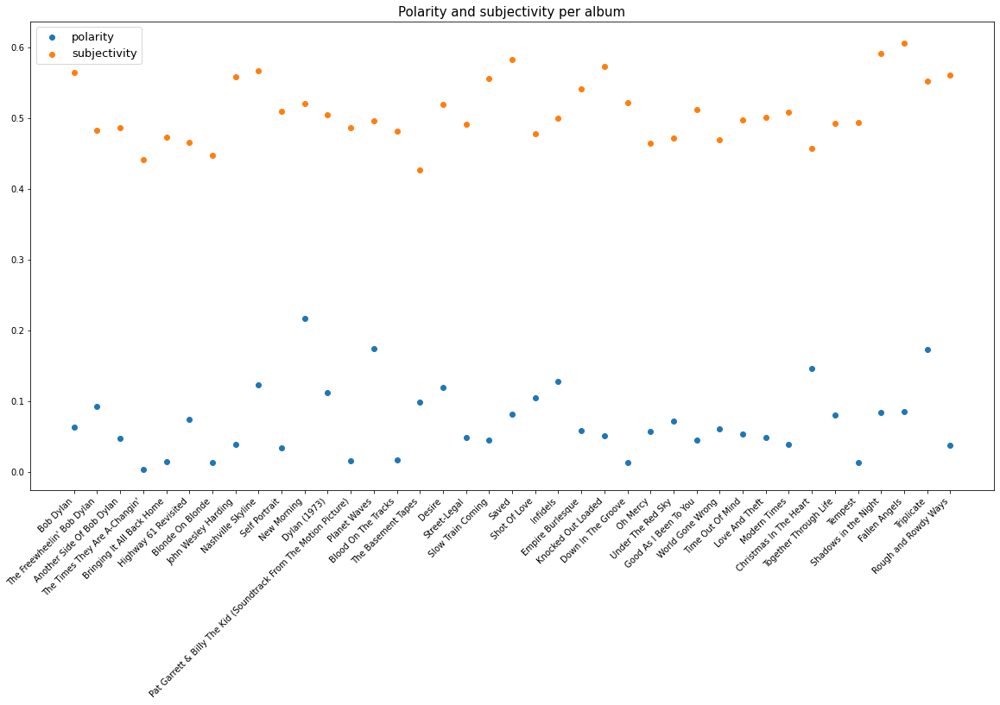

In [189]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation=45, ha="right")
plt.scatter(album_sentiment['album'], album_sentiment['polarity'], label = 'polarity')
plt.scatter(album_sentiment['album'], album_sentiment['subjectivity'], label = 'subjectivity')
#plt.legend(loc="upper left")
plt.title('Polarity and subjectivity per album', size=15)
plt.legend(loc=2, prop={'size': 13})

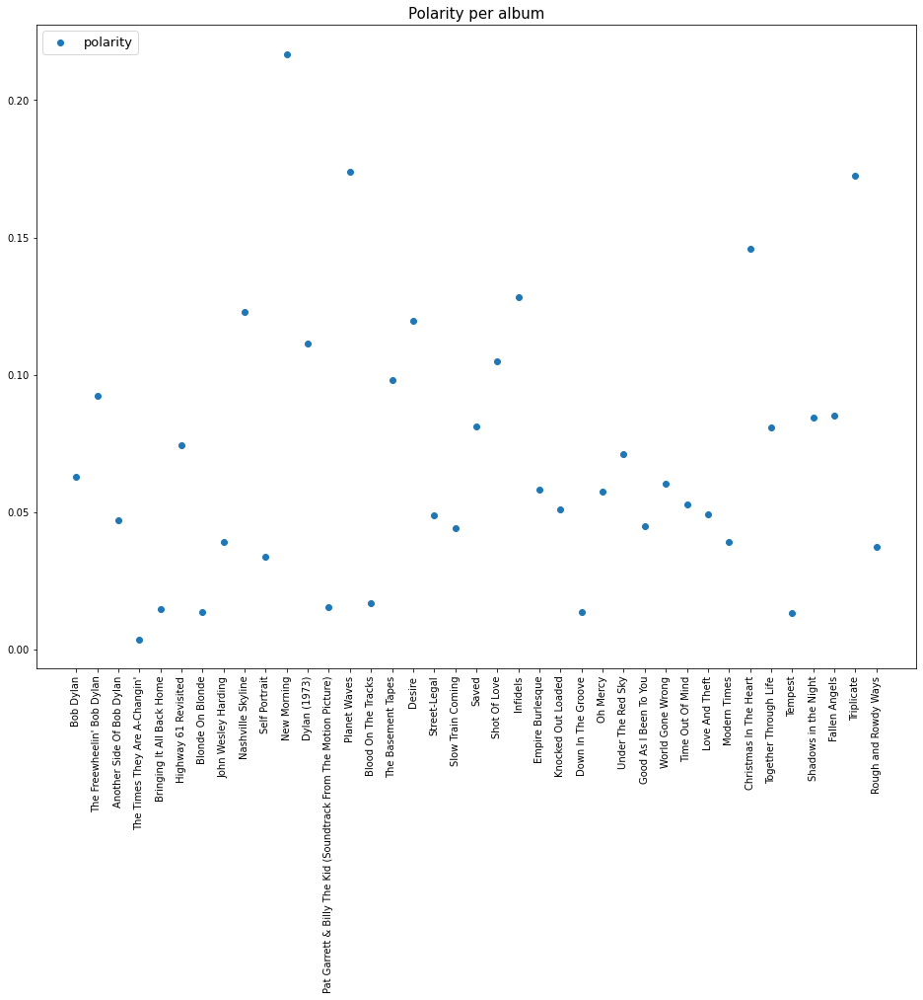

In [162]:
plt.xticks(rotation='vertical')
plt.scatter(album_sentiment['album'], album_sentiment['polarity'], label = 'polarity')
plt.title('Polarity per album', size=15)
plt.legend(loc=2, prop={'size': 13})

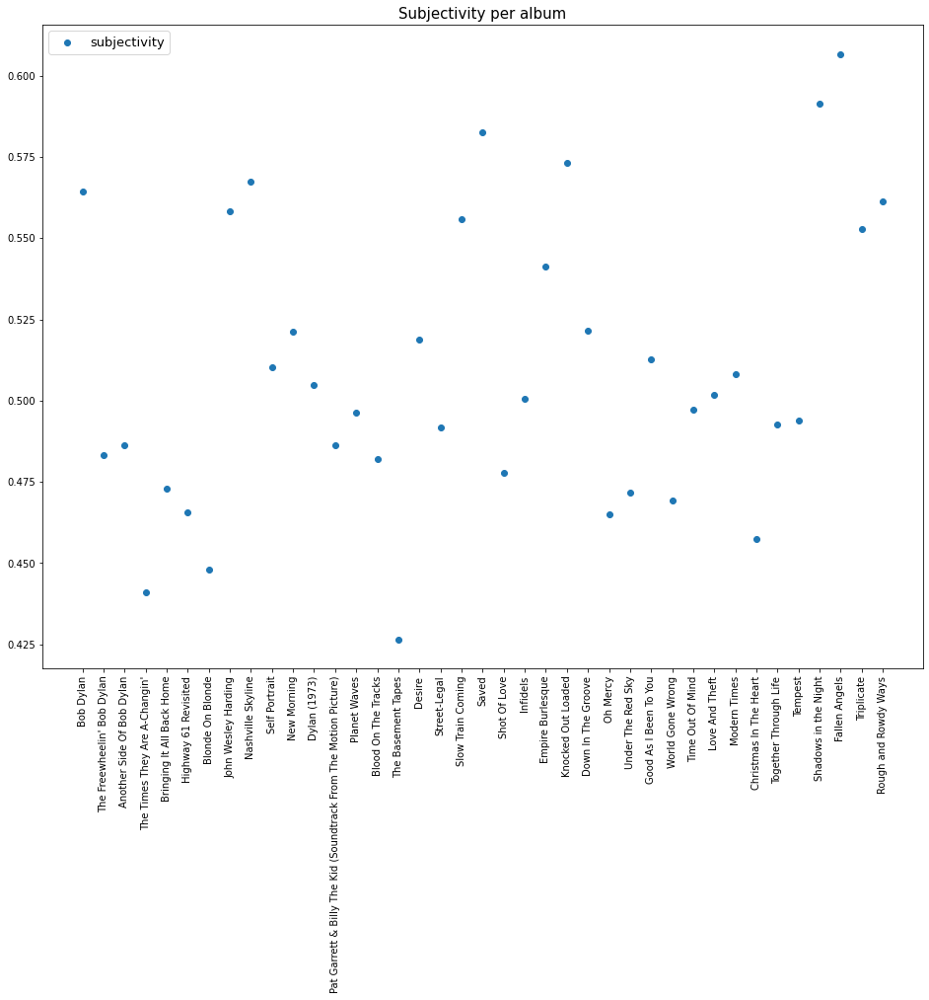

In [163]:
plt.xticks(rotation='vertical')
plt.scatter(album_sentiment['album'], album_sentiment['subjectivity'], label = 'subjectivity')
plt.title('Subjectivity per album', size=15)
plt.legend(loc=2, prop={'size': 13})

### group by song

In [164]:
information_song = [df_tutorial_NLP["relase_date"], df_tutorial_NLP["song"],  df_tutorial_NLP["album"], data_df[["polarity", 'subjectivity']]]

#headers = ["release_year", "polarity", "subjectivity"]

df_song = pd.concat(information_song, axis=1)

In [165]:
df_song.head()

,relase_date,song,album,polarity,subjectivity
0,1962,youre no good,Bob Dylan,0.152991,0.730342
1,1962,talkin new york,Bob Dylan,0.186541,0.450125
2,1962,in my time of dyin,Bob Dylan,0.262500,0.662500
3,1962,man of constant sorrow,Bob Dylan,-0.235000,0.570000
4,1962,fixin to die,Bob Dylan,-0.005820,0.681481


In [166]:
song_sentiment = df_song.groupby(['song', 'relase_date']).agg({"polarity":'mean',"subjectivity":'mean'}).reset_index()

In [167]:
song_sentiment = song_sentiment.sort_values(by=['relase_date'], ascending=True)

In [168]:
song_sentiment.head()

,song,relase_date,polarity,subjectivity
443,youre no good,1962,0.152991,0.730342
117,gospel plow,1962,0.700000,0.600000
132,highway 51 blues,1962,0.087188,0.442744
136,house of the risin sun,1962,0.015548,0.484235
105,freight train blues,1962,0.102083,0.533333


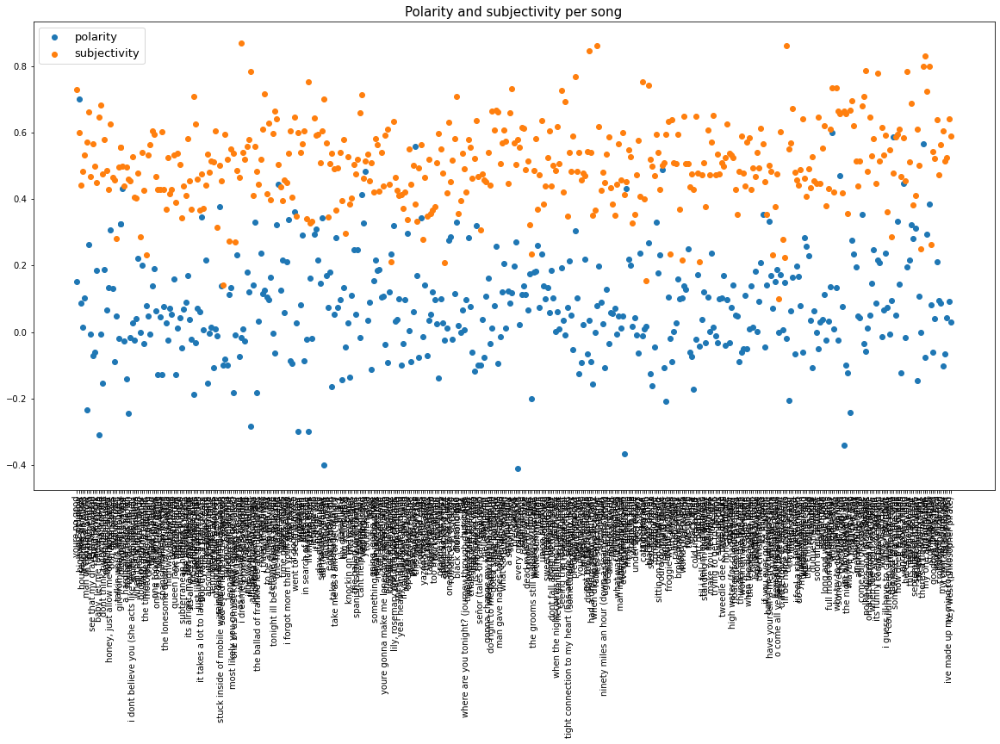

In [169]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation='vertical')
plt.scatter(song_sentiment['song'], song_sentiment['polarity'], label = 'polarity')
plt.scatter(song_sentiment['song'], song_sentiment['subjectivity'], label = 'subjectivity')
#plt.legend(loc="upper left")
plt.title('Polarity and subjectivity per song', size=15)
plt.legend(loc=2, prop={'size': 13})

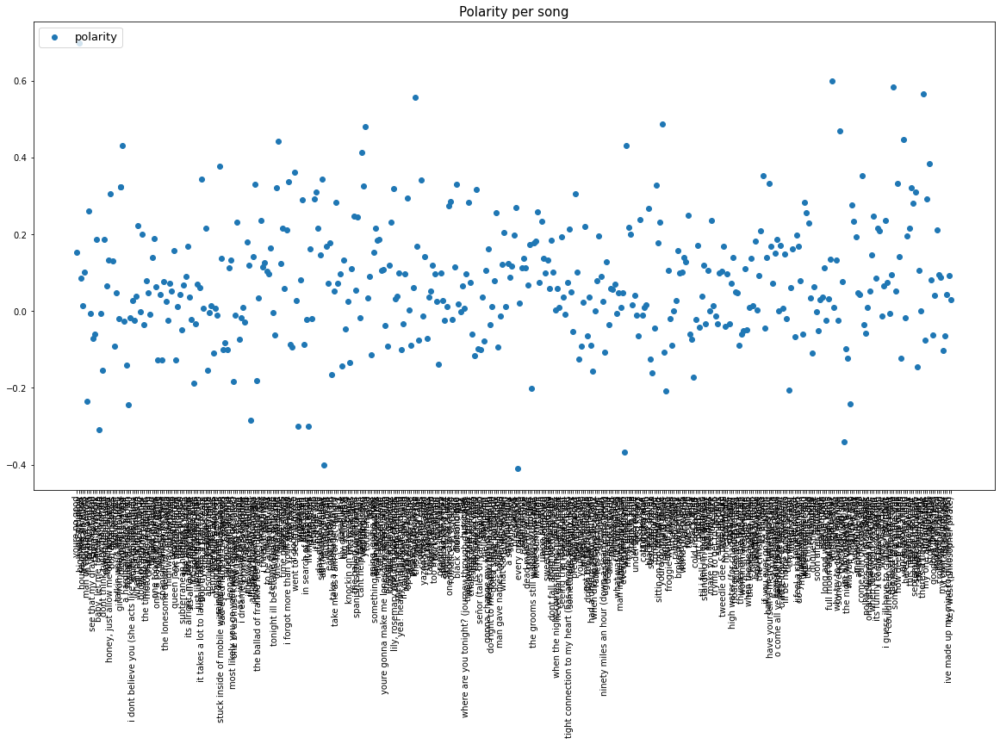

In [170]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation='vertical')
plt.scatter(song_sentiment['song'], song_sentiment['polarity'], label = 'polarity')
#plt.legend(loc="upper left")
plt.title('Polarity per song', size=15)
plt.legend(loc=2, prop={'size': 13})

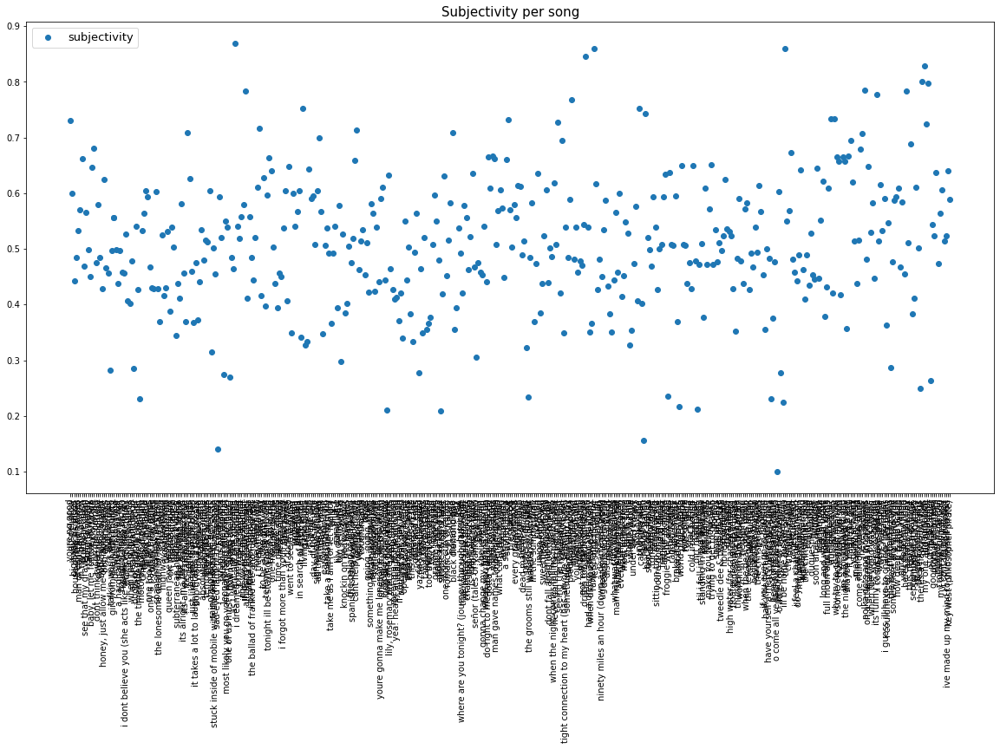

In [156]:
plt.figure(figsize=(20, 10))
plt.xticks(rotation='vertical')
plt.scatter(song_sentiment['song'], song_sentiment['subjectivity'], label = 'subjectivity')
#plt.legend(loc="upper left")
plt.title('Subjectivity per song', size=15)
plt.legend(loc=2, prop={'size': 13})

### Check if song features follow a similar pattern

In [174]:
import seaborn as sns

In [175]:
df_features_numerical = df_tutorial_NLP.select_dtypes(include= np.number)

In [176]:
df_features_numerical.head()

,relase_date,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,1962,33,0.563,0.679,0,-6.191,1,0.0441,0.825,0.000000,0.3360,0.760,123.380,97760,4
1,1962,33,0.520,0.443,7,-7.755,1,0.0399,0.811,0.001040,0.0489,0.766,123.900,197653,4
2,1962,34,0.593,0.364,11,-8.346,1,0.0388,0.852,0.000009,0.1480,0.388,125.854,158707,4
3,1962,36,0.377,0.397,7,-8.427,1,0.0312,0.817,0.049600,0.1870,0.462,108.591,187400,3
4,1962,30,0.600,0.348,9,-9.660,0,0.0360,0.817,0.000054,0.1100,0.655,127.078,139840,4


In [ ]:
for ele in df_features_numerical.columns:
    sns.distplot(df_features_numerical[ele])
    plt.subplots()

In [ ]:
for ele in df_features_numerical.columns[2:]:
    plt.figure(figsize=(20, 10))
    plt.xticks(rotation='vertical')
    plt.scatter(song_sentiment['song'], df_features_numerical[ele], label = ele)
    plt.scatter(song_sentiment['song'], song_sentiment['polarity'], label = 'polarity')
    plt.scatter(song_sentiment['song'], song_sentiment['subjectivity'], label = 'subjectivity')
    plt.legend(loc="upper left")
    plt.title(ele, size=15)
    plt.legend(loc=2, prop={'size': 13})
    

In [177]:
from sklearn import preprocessing

normalizer_ = preprocessing.Normalizer()
df_numerical_normalizer = normalizer_.fit_transform(df_features_numerical)

df_song_normalizer = normalizer_.fit_transform(data_df[['polarity', 'subjectivity']])

In [178]:
new_df_numerical_normalizer = pd.DataFrame(df_numerical_normalizer)
new_df_song_normalizer = pd.DataFrame(df_song_normalizer)

In [179]:
new_df_numerical_normalizer.columns = df_features_numerical.columns


In [180]:
new_df_numerical_normalizer.head()

,relase_date,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,0.020066,0.000337,0.000006,0.000007,0.000000,-0.000063,0.000010,4.510135e-07,0.000008,0.000000e+00,3.436294e-06,0.000008,0.001262,0.999798,0.000041
1,0.009926,0.000167,0.000003,0.000002,0.000035,-0.000039,0.000005,2.018589e-07,0.000004,5.261486e-09,2.473910e-07,0.000004,0.000627,0.999951,0.000020
2,0.012361,0.000214,0.000004,0.000002,0.000069,-0.000053,0.000006,2.444569e-07,0.000005,5.443576e-11,9.324645e-07,0.000002,0.000793,0.999923,0.000025
3,0.010469,0.000192,0.000002,0.000002,0.000037,-0.000045,0.000005,1.664796e-07,0.000004,2.646599e-07,9.978107e-07,0.000002,0.000579,0.999945,0.000016
4,0.014029,0.000215,0.000004,0.000002,0.000064,-0.000069,0.000000,2.574116e-07,0.000006,3.846874e-10,7.865355e-07,0.000005,0.000909,0.999901,0.000029


In [181]:
new_df_song_normalizer.columns = ['polarity', 'subjectivity']
new_df_song_normalizer.head()

,polarity,subjectivity
0,0.205029,0.978756
1,0.382846,0.923812
2,0.368364,0.929682
3,-0.381158,0.924510
4,-0.008540,0.999964


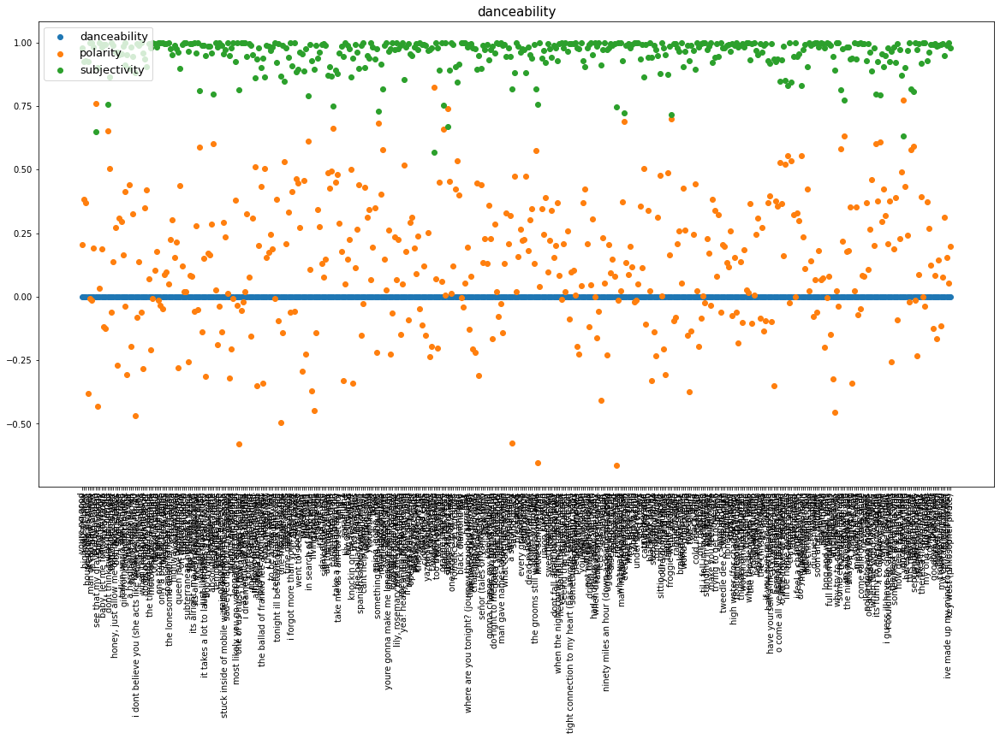

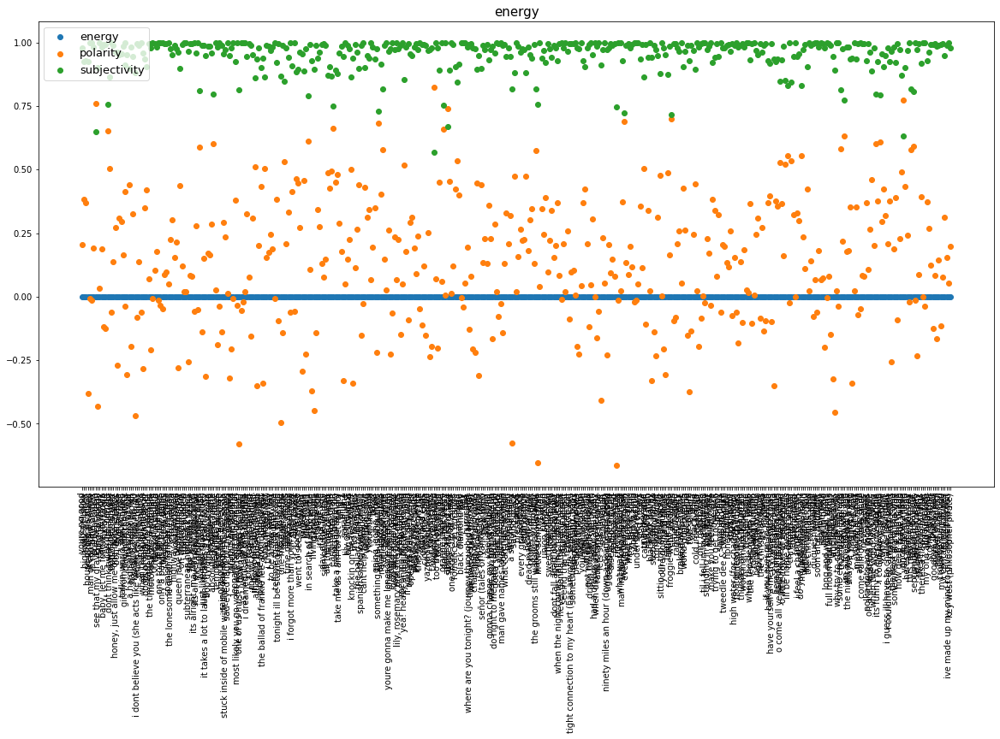

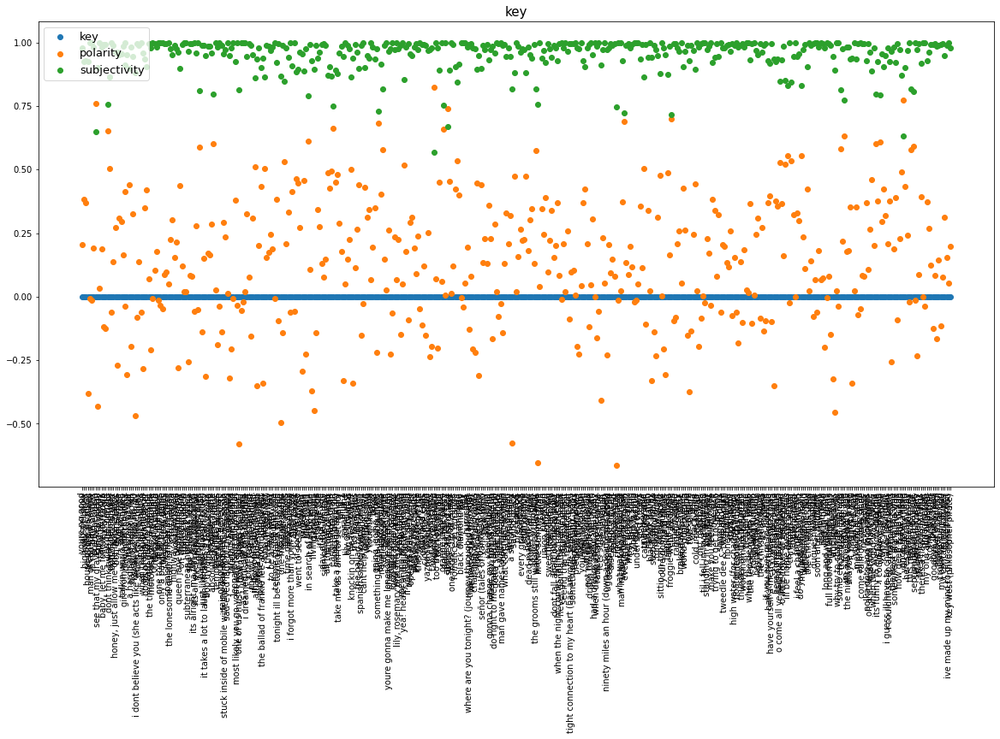

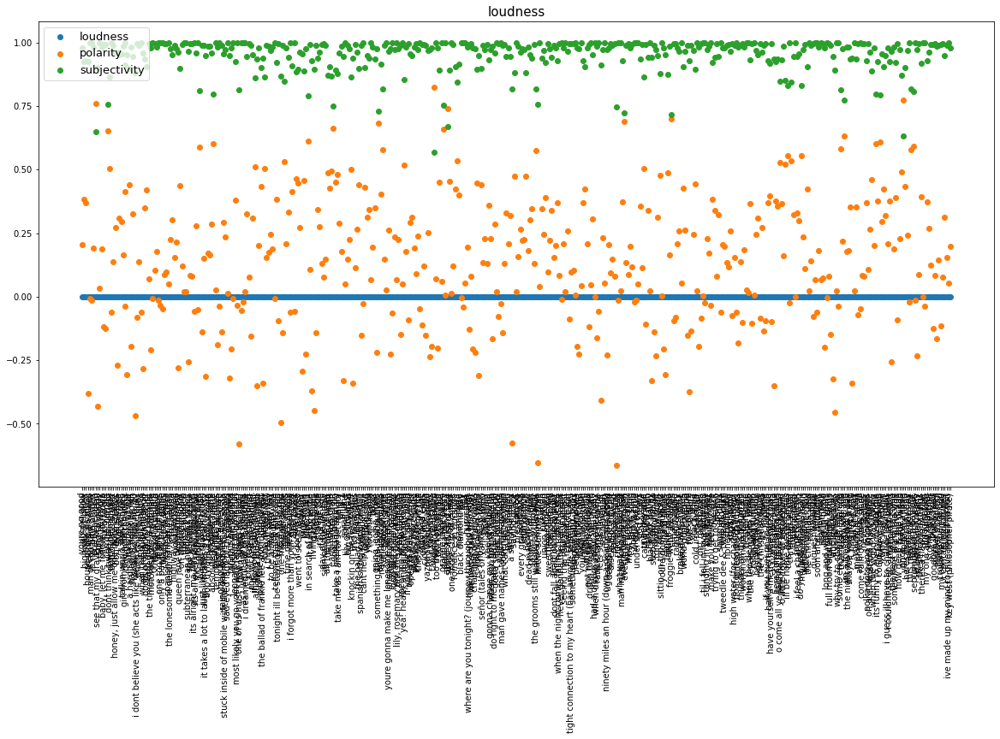

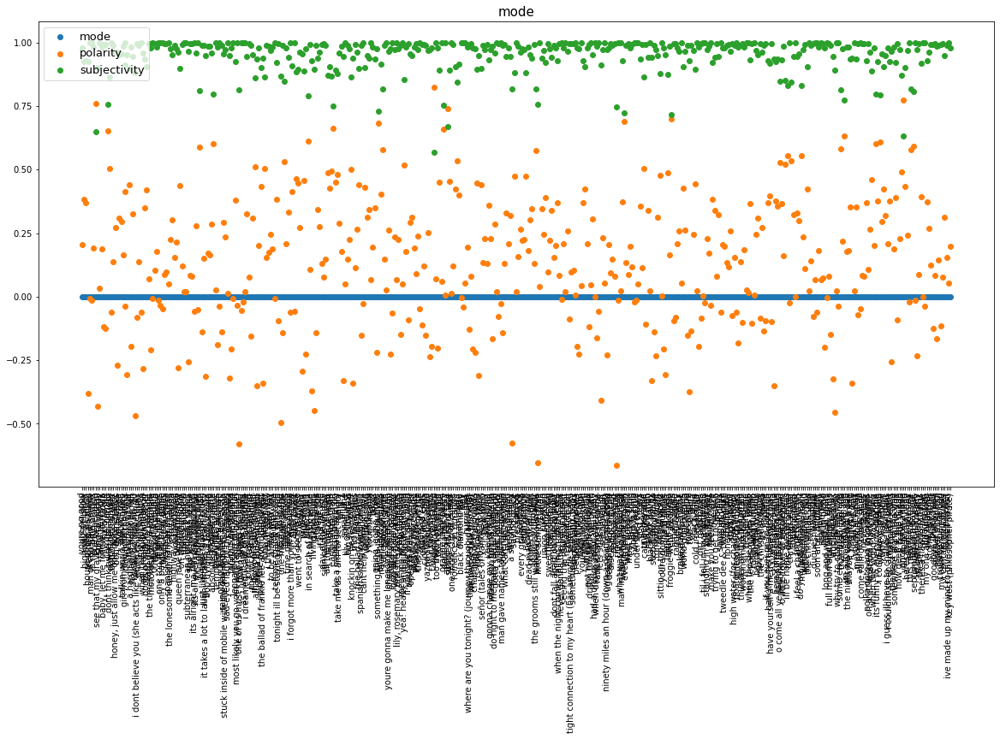

...

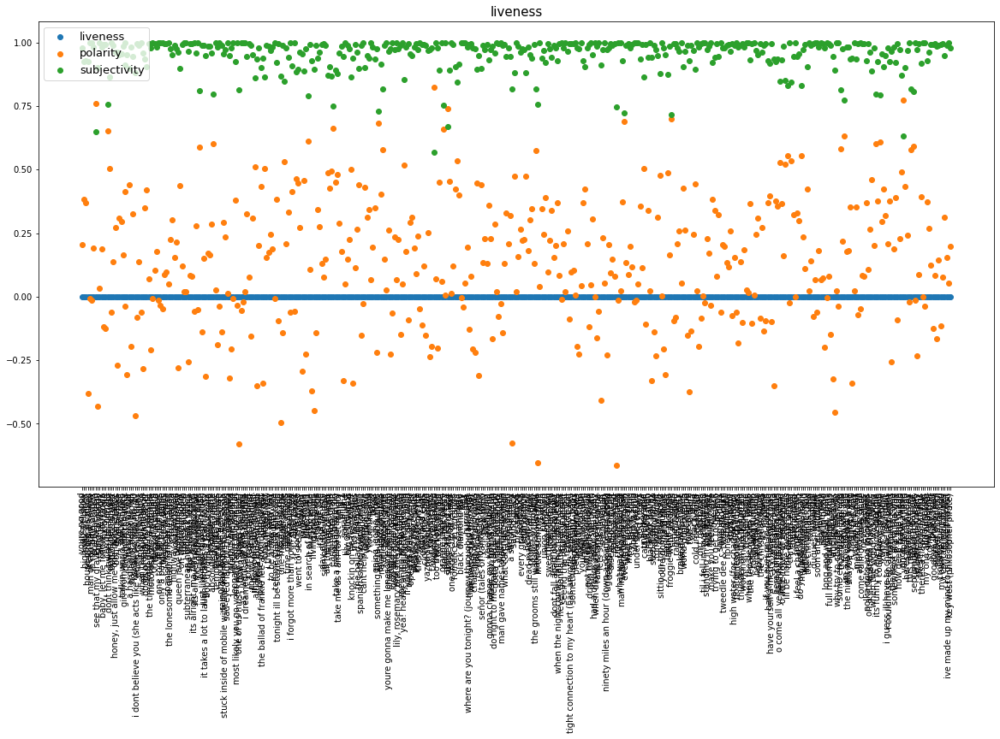

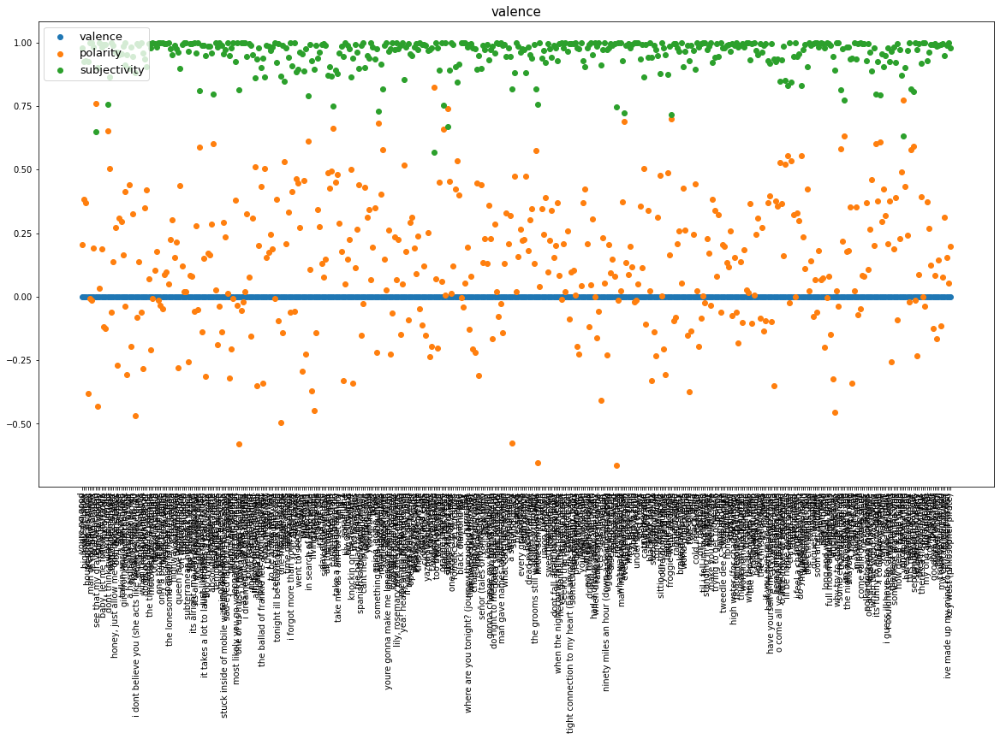

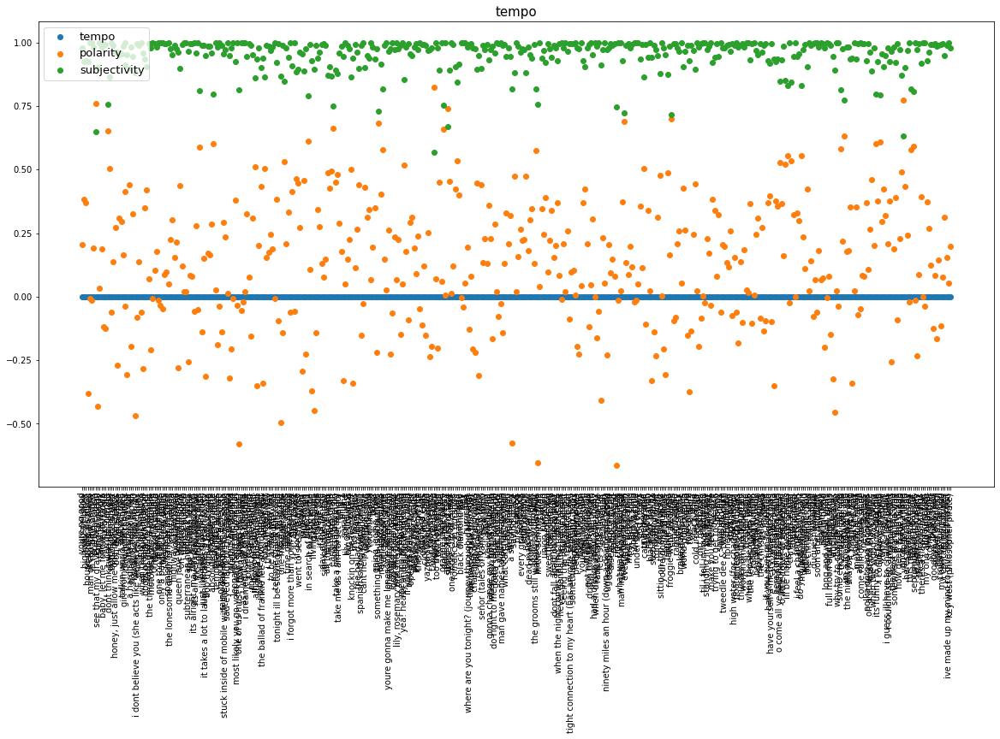

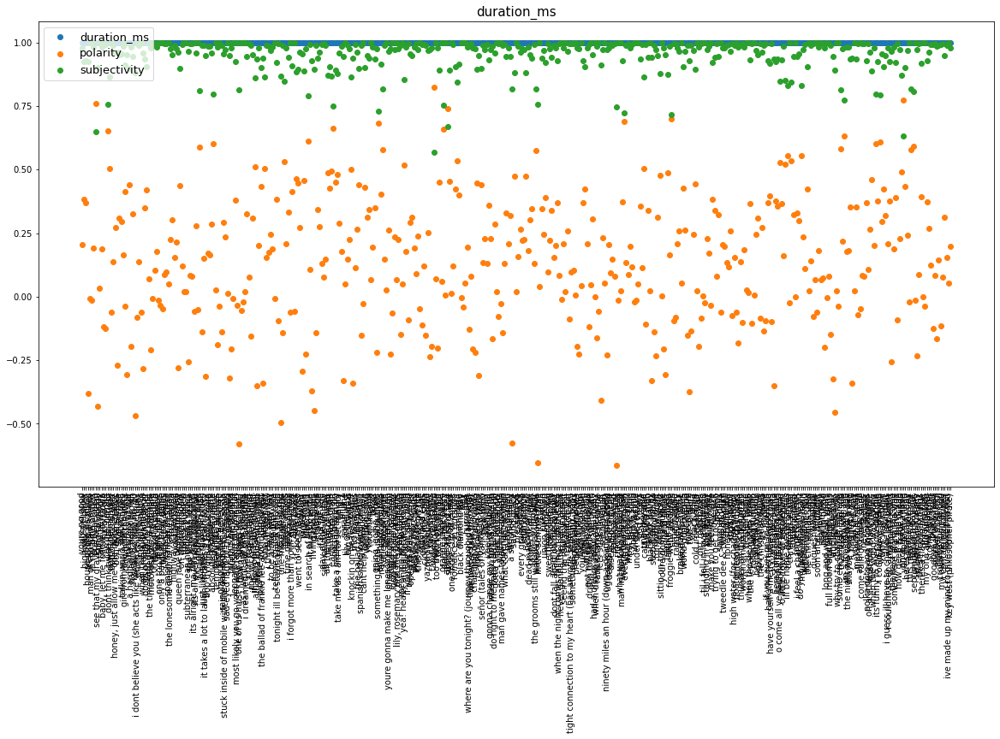

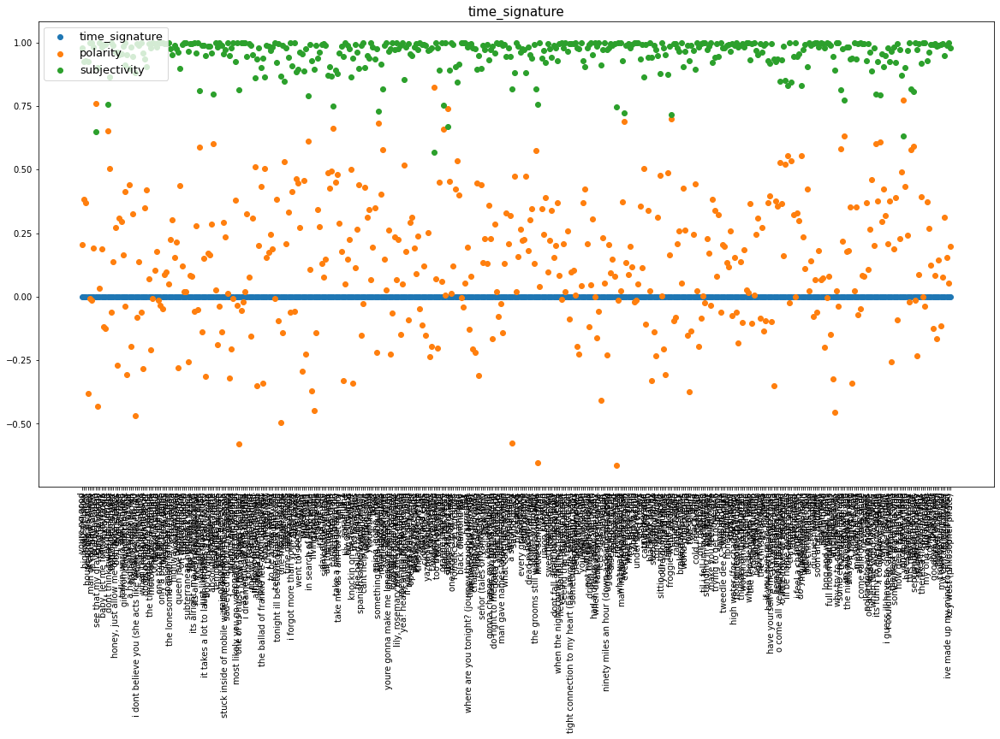

In [182]:
for ele in new_df_numerical_normalizer.columns[2:]:
    plt.figure(figsize=(20, 10))
    plt.xticks(rotation='vertical')
    plt.scatter(song_sentiment['song'], new_df_numerical_normalizer[ele], label = ele)
    plt.scatter(song_sentiment['song'], new_df_song_normalizer['polarity'], label = 'polarity')
    plt.scatter(song_sentiment['song'], new_df_song_normalizer['subjectivity'], label = 'subjectivity')
    plt.legend(loc="upper left")
    plt.title(ele, size=15)
    plt.legend(loc=2, prop={'size': 13})

In [ ]:
for ele in df_features_numerical.columns[2:]:
    plt.figure(figsize=(20, 10))
    plt.xticks(rotation='vertical')
    plt.plot(song_sentiment['song'][150:200], df_features_numerical[ele][150:200], label = ele)
    plt.plot(song_sentiment['song'][150:200], song_sentiment['polarity'][150:200], label = 'polarity')
    plt.plot(song_sentiment['song'][150:200], song_sentiment['subjectivity'][150:200], label = 'subjectivity')
    plt.legend(loc="upper left")
    plt.title(ele, size=15)
    plt.legend(loc=2, prop={'size': 13})

### Exploring correlation between sentiment analysis and features

In [183]:
df_correlation = pd.concat([df_features_numerical, song_sentiment[['polarity', 'subjectivity']]], axis=1)

In [184]:
data_matrix_continuous_ = df_correlation.corr()


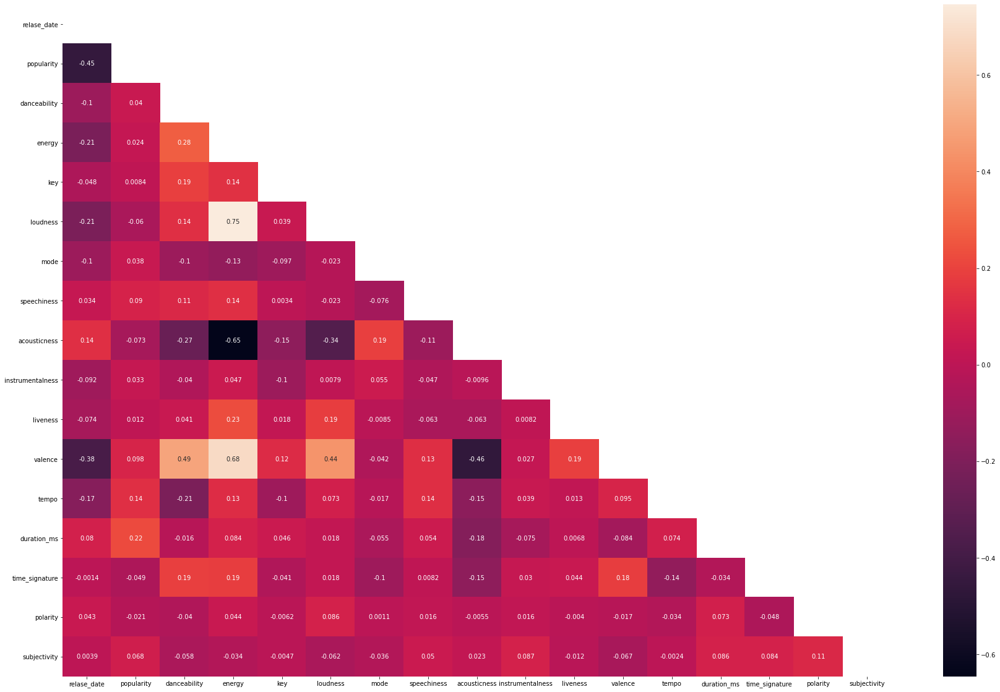

In [185]:
mask = np.zeros_like(data_matrix_continuous_)
mask[np.triu_indices_from(mask)] = True 
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.heatmap(data_matrix_continuous_, mask=mask, annot=True)
plt.show()

## Topic modeling

Introduction\
Another popular text analysis technique is called topic modeling. The ultimate goal of topic modeling is to find various topics that are present in your corpus. Each document in the corpus will be made up of at least one topic, if not multiple topics.

In this notebook, we will be covering the steps on how to do Latent Dirichlet Allocation (LDA), which is one of many topic modeling techniques. It was specifically designed for text data.

To use a topic modeling technique, you need to provide\
(1) a document-term matrix and\ 
(2) the number of topics you would like the algorithm to pick up.

Once the topic modeling technique is applied, your job as a human is to interpret the results and see if the mix of words in each topic make sense. \If they don't make sense, you can try changing up the number of topics, the terms in the document-term matrix, model parameters, or even try a different model.

### Topic Modeling - Attempt #1 (All Text)

In [ ]:
# Let's read in our document-term matrix
import pandas as pd
import pickle

data = pd.read_pickle('dtm_stop.pkl')
data

In [ ]:
# Import the necessary modules for LDA with gensim

from gensim import matutils, models
import scipy.sparse

# import logging
# logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [ ]:
# One of the required inputs is a term-document matrix
tdm = data.transpose()
tdm.head()

In [ ]:
# We're going to put the term-document matrix into a new gensim format, from df --> sparse matrix --> gensim corpus

sparse_counts = scipy.sparse.csr_matrix(tdm)
corpus = matutils.Sparse2Corpus(sparse_counts)

In [ ]:
# Gensim also requires dictionary of the all terms and their respective location in the term-document matrix
cv = pickle.load(open("cv_stop.pkl", "rb"))

id2word = dict((v, k) for k, v in cv.vocabulary_.items())

In [ ]:
# Now that we have the corpus (term-document matrix) and id2word (dictionary of location: term), 
# we need to specify two other parameters - the number of topics and the number of passes. 

# Let's start the number of topics at 2, see if the results make sense, and increase the number from there.


In [ ]:
# Now that we have the corpus (term-document matrix) and id2word (dictionary of location: term),
# we need to specify two other parameters as well - the number of topics and the number of passes

lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=10, passes=10)
lda.print_topics()

In [ ]:
# LDA for num_topics = 3

lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=3, passes=10)
lda.print_topics()

In [ ]:
# LDA for num_topics = 4

lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=4, passes=10)
lda.print_topics()

### Topic Modeling - Attempt #2 (Nouns Only)

In [ ]:
# One popular trick is to look only at terms that are from one part of speech (only nouns, only adjectives, etc.). 
# Check out the UPenn tag set: https://www.ling.upenn.edu/courses/Fall_2003/ling001/penn_treebank_pos.html.

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

In [ ]:
# Let's create a function to pull out nouns from a string of text
from nltk import word_tokenize, pos_tag

def nouns(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    tokenized = word_tokenize(text)
    all_nouns = [word for (word, pos) in pos_tag(tokenized) if is_noun(pos)] 
    return ' '.join(all_nouns)

In [ ]:
# Read in the cleaned data, before the CountVectorizer step

data_clean = pd.read_pickle("test_df_new['lyrics'].pkl")
data_clean

In [ ]:
# Apply the nouns function to the transcripts to filter only on nouns

data_nouns = pd.DataFrame(data_clean.apply(nouns))
data_nouns

In [ ]:
# Create a new document-term matrix using only nouns

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Re-add the additional stop words since we are recreating the document-term matrix

add_stop_words = ['like', 'im', 'know', 'just', 'dont', 'thats', 'right', 'people',
                  'youre', 'got', 'gonna', 'time', 'think', 'yeah', 'said', 'll', 'pum', 'oh', 'gon', "uhhuh", 'dah', 'man', 
                  'home', 'aint', 'ya', 'don', 'henry']
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate a document-term matrix with only nouns

cvn = CountVectorizer(stop_words=stop_words)
data_cvn = cvn.fit_transform(data_nouns['lyrics'])
data_dtmn = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())
data_dtmn.index = data_nouns.index
data_dtmn

In [ ]:
# Create the gensim corpus
corpusn = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmn.transpose()))

# Create the vocabulary dictionary
id2wordn = dict((v, k) for k, v in cvn.vocabulary_.items())

In [ ]:
# Let's start with 2 topics

ldan = models.LdaModel(corpus=corpusn, num_topics=2, id2word=id2wordn, passes=10)
ldan.print_topics()

In [ ]:
# Let's try topics = 3

ldan = models.LdaModel(corpus=corpusn, num_topics=3, id2word=id2wordn, passes=10)
ldan.print_topics()

In [ ]:
# Let's try 4 topics

ldan = models.LdaModel(corpus=corpusn, num_topics=10, id2word=id2wordn, passes=10)
ldan.print_topics()

### Topic Modeling - Attempt #3 (Nouns and Adjectives)

In [ ]:
# Let's create a function to pull out nouns from a string of text

def nouns_adj(text):
    '''Given a string of text, tokenize the text and pull out only the nouns and adjectives.'''
    is_noun_adj = lambda pos: pos[:2] == 'NN' or pos[:2] == 'JJ'
    tokenized = word_tokenize(text)
    nouns_adj = [word for (word, pos) in pos_tag(tokenized) if is_noun_adj(pos)] 
    return ' '.join(nouns_adj)

In [ ]:
# Apply the nouns function to the transcripts to filter only on nouns

data_nouns_adj = pd.DataFrame(data_clean.apply(nouns_adj))
data_nouns_adj

In [ ]:
# Create a new document-term matrix using only nouns and adjectives, also remove common words with max_df

cvna = CountVectorizer(stop_words=stop_words, max_df=.8)
data_cvna = cvna.fit_transform(data_nouns_adj['lyrics'])
data_dtmna = pd.DataFrame(data_cvna.toarray(), columns=cvna.get_feature_names())
data_dtmna.index = data_nouns_adj.index
data_dtmna

In [ ]:
# Create the gensim corpus
corpusna = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmna.transpose()))

# Create the vocabulary dictionary
id2wordna = dict((v, k) for k, v in cvna.vocabulary_.items())

In [ ]:
# Let's start with 2 topics

ldana = models.LdaModel(corpus=corpusna, num_topics=10, id2word=id2wordna, passes=10)
ldana.print_topics()

In [ ]:
# Let's try 3 topics

ldana = models.LdaModel(corpus=corpusna, num_topics=3, id2word=id2wordna, passes=10)
ldana.print_topics()

In [ ]:
# Let's try 4 topics

ldana = models.LdaModel(corpus=corpusna, num_topics=4, id2word=id2wordna, passes=10)
ldana.print_topics()

In [ ]:
# Let's try 4 topics

ldana = models.LdaModel(corpus=corpusna, num_topics=5, id2word=id2wordna, passes=80)
ldana.print_topics()

## Text generation

Introduction\
Markov chains can be used for very basic text generation.\
Think about every word in a corpus as a state. We can make a simple assumption that the next word is only dependent on the previous word - which is the basic assumption of a Markov chain.

Markov chains don't generate text as well as deep learning.

In [ ]:
# Read in the corpus, including punctuation!
import pandas as pd

data = pd.read_pickle('corpus.pkl')
data_df_text = pd.DataFrame(data)

In [ ]:
data_df.columns

In [ ]:

gen_song_text = data_df['lyrics'][34]
gen_song_text[:200]

### Build a Markov Chain Function
We are going to build a simple Markov chain function that creates a dictionary:

The keys should be all of the words in the corpus
The values should be a list of the words that follow the keys

In [ ]:
from collections import defaultdict

def markov_chain(text):
    '''The input is a string of text and the output will be a dictionary with each word as
       a key and each value as the list of words that come after the key in the text.'''
    
    # Tokenize the text by word, though including punctuation
    words = text.split(' ')
    
    # Initialize a default dictionary to hold all of the words and next words
    m_dict = defaultdict(list)
    
    # Create a zipped list of all of the word pairs and put them in word: list of next words format
    for current_word, next_word in zip(words[0:-1], words[1:]):
        m_dict[current_word].append(next_word)

    # Convert the default dict back into a dictionary
    m_dict = dict(m_dict)
    return m_dict

In [ ]:
# Create the dictionary for subterranean homesick blues, take a look at it
song_dict = markov_chain(gen_song_text)
song_dict

### Create a Text Generator
We're going to create a function that generates sentences. It will take two things as inputs:

The dictionary you just created
The number of words you want generated
Here are some examples of generated sentences:

'Shape right turn– I also takes so that she’s got women all know that snail-trail.'

'Optimum level of early retirement, and be sure all the following Tuesday… because it’s too.'

In [ ]:
import random

def generate_sentence(chain, count=15):
    '''Input a dictionary in the format of key = current word, value = list of next words
       along with the number of words you would like to see in your generated sentence.'''

    # Capitalize the first word
    word1 = random.choice(list(chain.keys()))
    sentence = word1.capitalize()

    # Generate the second word from the value list. Set the new word as the first word. Repeat.
    for i in range(count-1):
        word2 = random.choice(chain[word1])
        word1 = word2
        sentence += ' ' + word2

    # End it with a period
    sentence += '.'
    return(sentence)

In [ ]:
generate_sentence(song_dict)

# Word Embedding Techniques using Embedding Layer in Keras

In [ ]:
from tensorflow.keras.preprocessing.text import one_hot

In [ ]:
import seaborn as sns

In [ ]:
list_lyrics = list(df_tutorial_NLP['lyrics'])

In [ ]:
len(list_lyrics[57])
lent = []
for i in list_lyrics:
    lent.append(len(i))

In [ ]:
sns.distplot(lent)

In [ ]:
### Vocabulary size
voc_size=100000

In [ ]:
onehot_repr=[one_hot(words,voc_size)for words in list_lyrics] 
print(onehot_repr)

## Word Embedding Representation

In [ ]:
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential

In [ ]:
sent_length=3000

'''pre - will try to fill with zeroes'''
embedded_docs=pad_sequences(onehot_repr,padding='pre',maxlen=sent_length)
print(embedded_docs)

In [ ]:
dim=200

In [ ]:
model=Sequential()
model.add(Embedding(voc_size,dim,input_length=sent_length))
model.compile('adam','mse')

In [ ]:
model.summary()

In [ ]:
print(model.predict(embedded_docs))

In [ ]:
embedded_docs[0]

In [ ]:
print(model.predict(embedded_docs)[0])

# Word Embedding - word2vec

In [ ]:
list_lyrics = [list(df_tutorial_NLP['lyrics'])]

In [ ]:
# training word2vec model
from gensim.models import Word2Vec
import warnings
warnings.filterwarnings('ignore')
mymodel = Word2Vec(list_lyrics, min_count=1)

In [ ]:
print(mymodel)

In [ ]:
# summarize vocabulary
words = list(mymodel.wv.vocab)

In [ ]:
# summarize vocabulary
print(words)

In [ ]:
# access word vector for one word "training"
print(mymodel['love'])

In [ ]:
#try finding most similar words for word "Data"
mymodel.most_similar("love")

# Create model to predict album based on lyrics

## test - shrikar's tutorial

In [ ]:
import keras 
import numpy as np
from keras.preprocessing.text import Tokenizer
import numpy as np
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, Dropout, Embedding, LSTM, Flatten
from keras.models import Model
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
plt.style.use('ggplot')
%matplotlib inline
from IPython.core.display import display, HTML

In [ ]:
df_model = df_tutorial_NLP[['album', 'lyrics']]

In [ ]:
df_model.head()

### encoding target

In [ ]:
df_model['album'] = df_model['album'].astype('category').cat.codes

In [ ]:
df_model.head()

### Calculate the number of words in each song

In [ ]:
df_model['count_lyrics'] = df_model['lyrics'].apply(lambda x : len(x.split()))

In [ ]:
df_model.head()

### Binning the posts by word count.
#### Ideally we would want to know how many posts are short, medium and large posts. Binning is a technique is efficient mechanism to do that

In [ ]:
bins=[0,50,75, np.inf]

df_model['bins']=pd.cut(df_model['count_lyrics'], bins=[0,100,200,300,400, np.inf], labels=['0-100', '100-200', '200-300','300-400','>400'])

In [ ]:
word_distribution = df_model.groupby('bins').size().reset_index().rename(columns={0:'counts'})

In [ ]:
word_distribution.head()

In [ ]:
sns.barplot(x='bins', y='counts', data=word_distribution).set_title("Word distribution per bin")

### Set number of classes and target variable

In [ ]:
num_class = len(np.unique(df_model.album.values))

In [ ]:
num_class

In [ ]:
y = df_model['album'].values

### trial - tokenizing/clean up some words

In [ ]:
from spacy.lang.en import English

# Load English tokenizer, tagger, parser, NER and word vectors
nlp = English()

text = """He determined to drop his litigation with the monastry, and relinguish his claims to the wood-cuting and 
fishery rihgts at once. He was the more ready to do this becuase the rights had become much less valuable, and he had 
indeed the vaguest idea where the wood and river in question were."""

#  "nlp" Object is used to create documents with linguistic annotations.
my_doc = nlp(text)

# Create list of word tokens
token_list = []
for token in my_doc:
    token_list.append(token.text)

from spacy.lang.en.stop_words import STOP_WORDS

# Create list of word tokens after removing stopwords
filtered_sentence =[] 

for word in token_list:
    lexeme = nlp.vocab[word]
    if lexeme.is_stop == False:
        filtered_sentence.append(word) 
print(token_list)
print(filtered_sentence)

In [ ]:
# 1) batch-tokenizking
docs = list(nlp.pipe(df_model_.lyrics))

In [ ]:
df_model_.lyrics

In [ ]:
#2 batch-tokenizing
lyrics_token = [token.text for token in docs]

In [ ]:
lyrics_token

In [ ]:
import numpy as np
import spacy

nlp = spacy.load("en_core_web_sm")
words = [["flower", "grows", "garden"], ["boy", "running", "playground"]]

lengths = np.cumsum([0] + list(map(len, words)))
print(lengths)


flat_words = [item for sublist in words for item in sublist]
doc = spacy.tokens.Doc(nlp.vocab, words=flat_words)

lemmatized = []
# Iterate starting with 1
for index in range(1, len(lengths)):
    # Slice doc as described in the first point, so [0:3] and [3:6]
    span = doc[lengths[index - 1] : lengths[index]]
    # Add lemmatized tokens as list to the list
    lemmatized.append([token.lemma_ for token in span])

print(lemmatized)

In [ ]:
len(token_list)

In [ ]:
# Create list of word tokens
token_list = []
for lists in range(len(list_my_doc)):
    for song in range(len(list_my_doc[lists])):
        print(list_my_doc[lists][song])


In [ ]:
    for song in list_my_doc[lists]:
        for token in song:
            token_list.append(token.text)

In [ ]:
len(token_list)

In [ ]:
token_list

In [ ]:
lii = ["a", "about", "above", "after", "again", "against", "ain", 'of', 'im', 'do',
       "all", "am", "an", "and", "any", "are", "aren", "arent", "as", "at", "be", "because", "been", "before", "being", "below", "between", "both", "but", "by", "can", "couldn", "couldnt", "d", "did", "didn", "didnt", "do", "does", "doesn", "doesnt", "doing", "don", "dont", "down", "during", "each", "few", "for", "from", "further", "had", "hadn", "hadnt", "has", "hasn", "hasnt", "have", "haven", "havent", "having", "he", "her", "here", "hers", "herself", "him", "himself", "his", "how", "i", "if", "in", "into", "is", "isn", "isnt", "it", "its", "its", "itself", "just", "ll",
       "m", "ma", "me", "mightn", "mightnt", "more", "most", "mustn", "mustnt", "my", "myself", "needn", "neednt", "no", "nor", "not", "now", "o", "of", "off", "on", "once", "only", "or", "other", "our", "ours", "ourselves", "out", "over", "own", "re", "s", "same", "shan", "shan't", "she", "she's", "should", "shouldve", "shouldn", "shouldnt", "so", "some", "such", "t", "than", "that", "that'll", "the", "their", "theirs", "them", "themselves", "then", "there", "these", "they", "this", "those", "through", "to", "too", "under", "until", "up", "ve", "very", "was", "wasn", "wasn't", "we", "were", "weren", "werent", "what", "when", "where", "which", "while", "who", "whom", "why", "will", "with", "won", "wont", "wouldn", "wouldnt", "y", "you", "youd", "youll", "youre", "youve", "your", 
       "yours", "yourself", "yourselves", "could", "hed", "hell", "hes", "heres", 'you', 'he', 'she', 'we', 'they', 'it,'
       "hows", "id", "ill", "im", "ive", "lets", "ought", "shed", "shell", "thats", "theres", "theyd", "theyll", "theyre", "theyve",
       "wed", "were", "weve", "whats", "whens", "wheres", "whos", "whys", "would", 'when', 'where', 'who', 'well']

In [ ]:
df_model_ = df_model

In [ ]:
for word in lii:
    for song in range(len(df_model__.lyrics)):
        df_model__.lyrics[song].replace(word, "")

In [ ]:
df_model_.head()

In [ ]:
MAX_LENGTH = 10000
tokenizer = Tokenizer(stop_words='english')
tokenizer.fit_on_texts(df_model.lyrics.values)
post_seq = tokenizer.texts_to_sequences(df_model.lyrics.values)
post_seq_padded = pad_sequences(post_seq, maxlen=MAX_LENGTH)

In [ ]:
post_seq

### Tokenize the input
#### For a deep learning model we need to know what the input sequence length for our model should be. The distribution graph about shows us that for we have less than 60 posts with more than 400 words.

#### Given the above information we can set the Input sequence length to be max(words per post). By doing so we are essentially wasting a lot of resources so we make a tradeoff and set the the Input sequence length to 500

In [ ]:
MAX_LENGTH = 400
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df_model.lyrics.values)
post_seq = tokenizer.texts_to_sequences(df_model.lyrics.values)
post_seq_padded = pad_sequences(post_seq, maxlen=MAX_LENGTH)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(post_seq_padded, y, test_size=0.05)

In [ ]:
vocab_size = len(tokenizer.word_index) + 1

## Deep Learning Model : Simple

### Let start with a simple model where the build an embedded layer, Dense followed by our prediction

In [ ]:
inputs = Input(shape=(MAX_LENGTH, ))
embedding_layer = Embedding(vocab_size,
                            1000,
                            input_length=MAX_LENGTH)(inputs)
x = Flatten()(embedding_layer)
x = Dense(500, activation='relu')(x)

predictions = Dense(num_class, activation='softmax')(x)
model = Model(inputs=[inputs], outputs=predictions)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

model.summary()
filepath="weights-simple.hdf5"
checkpointer = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
history = model.fit([X_train], batch_size=500, y=to_categorical(y_train), verbose=1, validation_split=0.25, 
          shuffle=True, epochs=10, callbacks=[checkpointer])

## Understanding the model fit

In [ ]:
df = pd.DataFrame({'epochs':history.epoch, 'accuracy': history.history['acc'], 'validation_accuracy': history.history['val_acc']})
g = sns.pointplot(x="epochs", y="accuracy", data=df, fit_reg=False)
g = sns.pointplot(x="epochs", y="validation_accuracy", data=df, fit_reg=False, color='green')

## Lets look at accuracy

In [ ]:
predicted = model.predict(X_test)
predicted = np.argmax(predicted, axis=1)
accuracy_score(y_test, predicted)

## Recurrent Neural Networks

### For our example we will use LSTM’s to capture the notion of time in our posts. Which means we tend to see certain words after or before some other context word X and we would want to capture that.

In [ ]:
inputs = Input(shape=(MAX_LENGTH, ))
embedding_layer = Embedding(vocab_size,
                            500,
                            input_length=MAX_LENGTH)(inputs)

x = LSTM(30)(embedding_layer)
x = Dense(20, activation='relu')(x)
predictions = Dense(num_class, activation='softmax')(x)
model = Model(inputs=[inputs], outputs=predictions)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

model.summary()

In [ ]:
filepath="weights.hdf5"
checkpointer = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
history = model.fit([X_train], batch_size=64, y=to_categorical(y_train), verbose=1, validation_split=0.25, 
          shuffle=True, epochs=10, callbacks=[checkpointer])

In [ ]:
df = pd.DataFrame({'epochs':history.epoch, 'accuracy': history.history['acc'], 'validation_accuracy': history.history['val_acc']})
g = sns.pointplot(x="epochs", y="accuracy", data=df, fit_reg=False)
g = sns.pointplot(x="epochs", y="validation_accuracy", data=df, fit_reg=False, color='green')

In [ ]:
model.load_weights('weights.hdf5')
predicted = model.predict(X_test)

In [ ]:
predicted

In [ ]:
predicted = np.argmax(predicted, axis=1)

In [ ]:
accuracy_score(y_test, predicted)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import SGD

model = Sequential()
model.add(Dense(5000, activation='relu', input_dim=X_train.shape[1]))
model.add(Dropout(0.1))
model.add(Dense(600, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(y_train, activation='sigmoid'))

sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='binary_crossentropy',
              optimizer=sgd)

model.fit(X_train, y_train, epochs=5, batch_size=2000)

preds = model.predict(X_test)
preds[preds>=0.5] = 1
preds[preds<0.5] = 0
# score = compare preds and y_test

# test

In [ ]:
from transformers import TFBertModel,  BertConfig, BertTokenizerFast
# Then what you need from tensorflow.keras
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.utils import to_categorical
# And pandas for data import + sklearn because you allways need sklearn
import pandas as pd
from sklearn.model_selection import train_test_split

In [ ]:
df_model_ = df_model.drop(['count_lyrics', 'bins'], axis=1)

In [ ]:
df_model_.head()

In [ ]:
df_model_['album_label'] = pd.Categorical(df_tutorial_NLP['album'])

In [ ]:
df_model_.head()

In [ ]:
# Split into train and test - stratify over Issue
data, data_test = train_test_split(df_model_, test_size = 0.2, stratify = df_model_[['album']])

In [ ]:
#######################################
### --------- Setup BERT ---------- ###
# Name of the BERT model to use
model_name = 'bert-base-uncased'
# Max length of tokens
max_length = 500
# Load transformers config and set output_hidden_states to False
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False
# Load BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, config = config)
# Load the Transformers BERT model
transformer_model = TFBertModel.from_pretrained(model_name, config = config)

In [ ]:
# Load the MainLayer
bert = transformer_model.layers[0]
# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
inputs = {'input_ids': input_ids}
# Load the Transformers BERT model as a layer in a Keras model
bert_model = bert(inputs)[1]
dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
pooled_output = dropout(bert_model, training=False)

# Then build your model output
album_pred = Dense(units=len(df_model_['album_label'].value_counts()), 
                   kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name='album_pred')(pooled_output)
outputs = {'album_pred': album_pred}
# And combine it all in a model object
model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel_MultiClass')
# Take a look at the model
model.summary()

In [ ]:
#######################################
### ------- Train the model ------- ###
# Set an optimizer
optimizer = Adam(
    learning_rate=5e-05,
    epsilon=1e-08,
    decay=0.01,
    clipnorm=1.0)
# Set loss and metrics
loss = {'album_pred': CategoricalCrossentropy(from_logits = True)}
metric = {'album_pred': CategoricalAccuracy('accuracy')}
# Compile the model
model.compile(
    optimizer = optimizer,
    loss = loss, 
    metrics = metric)

# Ready output data for the model
y_album = to_categorical(df_model_['album'])

# Tokenize the input (takes some time)
x = tokenizer(
    text=df_model_['lyrics'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)

# Fit the model
history = model.fit(
    x={'input_ids': x['input_ids']},
    y={'album_pred': y_album},
    validation_split=0.2,
    batch_size=64,
    epochs=10)

In [ ]:
#######################################
### ----- Evaluate the model ------ ###
# Ready test data
test_y_album = to_categorical(data_test['album'])

test_x = tokenizer(
    text=data_test['lyrics'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)
# Run evaluation
model_eval = model.evaluate(
    x={'input_ids': test_x['input_ids']},
    y={'album': test_y_album}
)

# Trying Keras tutorial - google

# Clustering features